# $\hspace{1.5 cm}$ **Atención: Esta Notebook debe ejecutarse usando Google Colab**

# **Práctica 3 - Visión Artificial**

**Autores:** José María García Ortiz, Levi Malest Villareal y Ana Gil Molina

## Importación de las librerías necesarias

In [1]:
# Cargamos aquí las librerías que vamos a utilizar:

import math
import numpy as np
import matplotlib.pyplot as plt
import skimage
import skimage.transform as transform
import skimage.exposure as exposure
import skimage.filters as filters
import skimage.color as color
import skimage.morphology as morphology
import skimage.restoration as restoration
import cv2
import matplotlib

from matplotlib import patches
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.patches import Rectangle
from scipy import ndimage as ndi
from ipywidgets import FloatSlider, interact, fixed
import pickle
import os
import matplotlib.colors as mcolors

# from google.colab.patches import cv2_imshow
from skimage import measure

## Definición de funciones auxiliares
Definimos algunas funciones auxiliares reutilizando el código de las notebooks de clase

In [2]:
def imshow_all(*images, titles=None, cmaps=None):
    # Convertimos a imágenes de tipo float skimage (https://scikit-image.org/docs/stable/user_guide/numpy_images.html):
    images = [skimage.img_as_float(img) for img in images]
    if titles is None:
        titles = [''] * len(images)
    # Escalamos la visualización de imágenes al rango entre el máximo y el mínimo
    # valor de píxel de *todas* las imágenes a mostrar:
    vmin, vmax = min(map(np.min, images)), max(map(np.max, images))
    fig, axes = plt.subplots(nrows=1, ncols=len(images), figsize=(5.0*len(images), 5.0))
    if cmaps is None:
        cmaps = len(images)*["gray"]
    for ax, img, label, cmap in zip(axes.ravel(), images, titles, cmaps):
        ax.imshow(img, vmin=vmin, vmax=vmax, cmap=cmap)
        ax.set_title(label)


def plot_gauss_filter(image, sigma):
  impulse = np.zeros((9, 9), dtype=float)
  impulse[4, 4] = 1.0
  gauss_filter = filters.gaussian(impulse, sigma=sigma)
  img_gauss_filtered = filters.gaussian(image, sigma=sigma)
  fig, axs = plt.subplots(1, 3, figsize = (15.,5.))
  axs[0].imshow(image, cmap="gray")
  axs[0].set_title("Original")
  axs[1].imshow(img_gauss_filtered, cmap="gray")
  axs[1].set_title(f"Resultado de filtro gaussiano")
  axs[2].imshow(gauss_filter, cmap="gray")
  axs[2].set_title("Filtro utilizado")
  plt.show();

  interact(plot_gauss_filter,
         image=fixed(img_pixelated),
         sigma=FloatSlider(value=1.0,min=1.0,max=2.0, orientation='horizontal', continuous_update=False));

## Código para leer ficheros desde Drive

In [3]:
from google.colab import drive
import os
import shutil
import gdown
import zipfile


# IDs de los archivos compartidos (reemplaza con los IDs de tus archivos .zip)
file_ids = ['1uvwBQvi8JUTpMsxokUGt_PZ7VXWSY5Nn']  # Cambia estos IDs por los de tus archivos

# Nombres locales para los archivos descargados y descomprimidos
download_paths = ['/CVFiles2.zip']
extract_paths = ['']

# Descargar y descomprimir cada archivo
for file_id, download_path, extract_path in zip(file_ids, download_paths, extract_paths):
    # Descargar archivo
    gdown.download(f'https://drive.google.com/uc?id={file_id}', download_path, quiet=False)

    # Descomprimir el archivo ZIP
    with zipfile.ZipFile(download_path, 'r') as zip_ref:
        zip_ref.extractall(extract_path)
        print(f"Archivos descomprimidos en '{extract_path}'")

Downloading...
From: https://drive.google.com/uc?id=1uvwBQvi8JUTpMsxokUGt_PZ7VXWSY5Nn
To: /CVFiles2.zip
100%|██████████| 22.9M/22.9M [00:01<00:00, 12.9MB/s]

Archivos descomprimidos en ''


## <div style="background-color: #54c7ec; color: #fff; font-weight: 700; padding-left: 10px; padding-top: 5px; padding-bottom: 5px"><strong> RC3A:  (0.5 puntos)</strong></div>

Cargar en el notebook un repertorio de al menos cuatro imágenes de objetos propios aproxi
madamente planares diferentes (p.e., libros, fotos, CDs, o cualquier otro objeto con su ciente textura). Los
 objetos deberán llenar prácticamente toda la imagen de entrada (es decir, el rectángulo que los englobe
 debe coincidir aproximadamente con el tamaño de cada imagen3). Extraer a continuación sus features
 SIFT y descriptores asociados, almacenándolos en variables separadas para cada imagen4.

In [4]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import random
import os

In [5]:
# Función para cargar una imagen
def load_image(image_path):
    img = cv2.imread(image_path)
    if img is None:
        print(f"Error al cargar la imagen: {image_path}")
        return None
    return img

In [6]:
# Fución para extraer  SIFT keypoints and descriptores
def extract_sift_features(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)  # Convertir a escala de grises
    sift = cv2.SIFT_create()  # Inicializar el detector SIFT
    keypoints, descriptors = sift.detectAndCompute(gray, None)
    return keypoints, descriptors

In [7]:
# Función para mostrar y guardar la imagen con keypoints dibujados
def display_and_save_keypoints(image, keypoints, image_path):
    img_with_keypoints = cv2.drawKeypoints(image, keypoints, None)
    # Mostrar la imagen con keypoints
    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(img_with_keypoints, cv2.COLOR_BGR2RGB))
    plt.title(f'SIFT Keypoints - {image_path}')
    plt.axis('off')
    plt.show()

    # Opcional: guardar imagen con  keypoints dribujados
    save_path = f'sift_keypoints_{image_path.split("/")[-1]}'
    cv2.imwrite(save_path, img_with_keypoints)
    print(f"Saved image with keypoints as: {save_path}")

In [8]:
# Función para almacenar keypoints and descriptores en el dictionary
def store_features_in_dict(image_path, keypoints, descriptors, features_dict):
    features_dict[image_path] = {'keypoints': keypoints, 'descriptores': descriptors}

In [9]:
# Función para imprimir las características de cada imagen.
def print_features(features_dict):
    for image_path, features in features_dict.items():
        print(f"\nImage: {image_path}")
        keypoints = features['keypoints']
        descriptors = features['descriptores']
        print(f"Número de keypoints detectados: {len(keypoints)}")
        if descriptors is not None:
            print(f"Forma de descriptores: {descriptors.shape}")
        else:
            print("No se encontraron descriptores.")

In [10]:
# Función principal para procesar múltiples imágenes.
def process_images(image_paths):
    # Diccionario para almacenar los keypoint y descriptores
    features_dict = {}

    for image_path in image_paths:
        # Cargar la imagen
        img = load_image(image_path)
        if img is None:
            continue  # Salta a la siguiente imagen si falla la carga

        # Extraer características SIFT
        keypoints, descriptors = extract_sift_features(img)

        # Almacenar las características en el diccionario.
        store_features_in_dict(image_path, keypoints, descriptors, features_dict)

        # Mostrar y guardar los keypoints
        display_and_save_keypoints(img, keypoints, image_path)

    # Imprime las características almacenadas en el diccionario.
    print_features(features_dict)

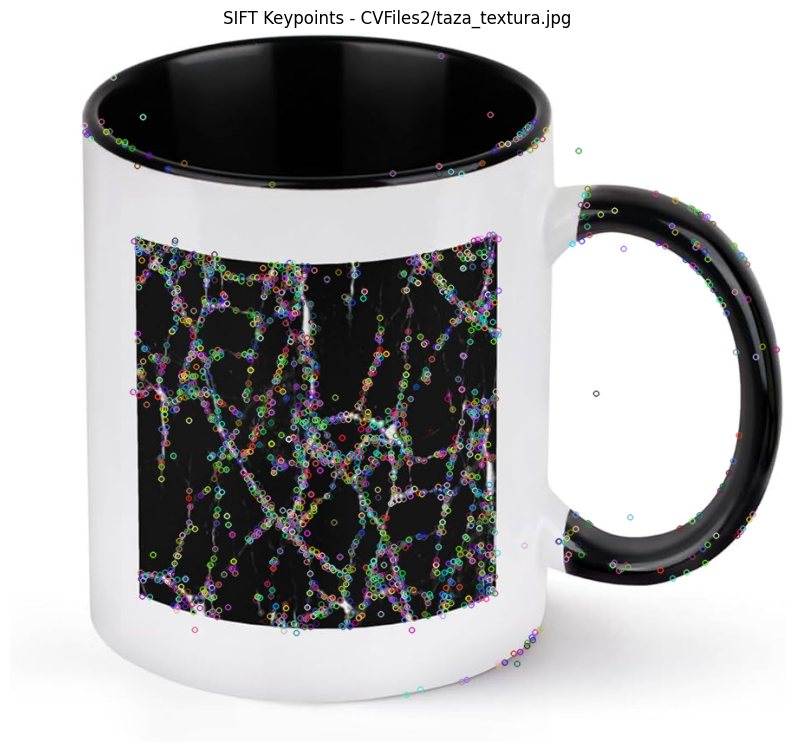

Saved image with keypoints as: sift_keypoints_taza_textura.jpg


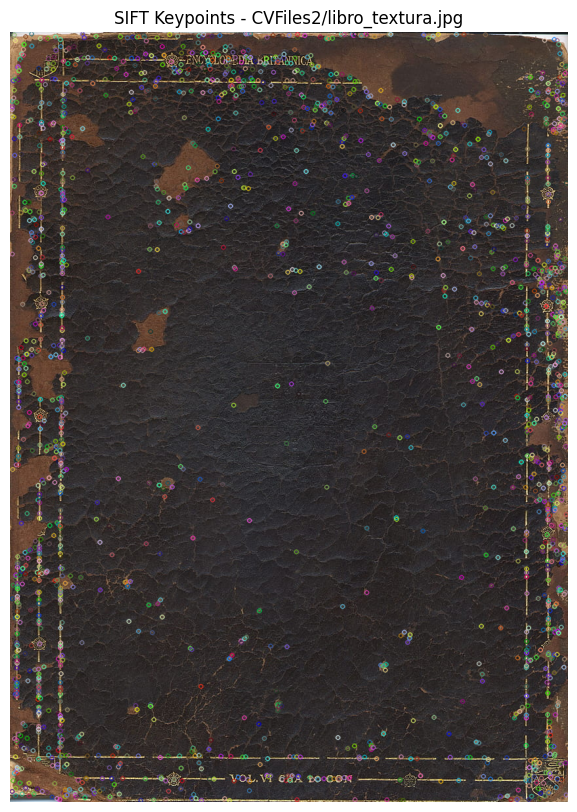

Saved image with keypoints as: sift_keypoints_libro_textura.jpg


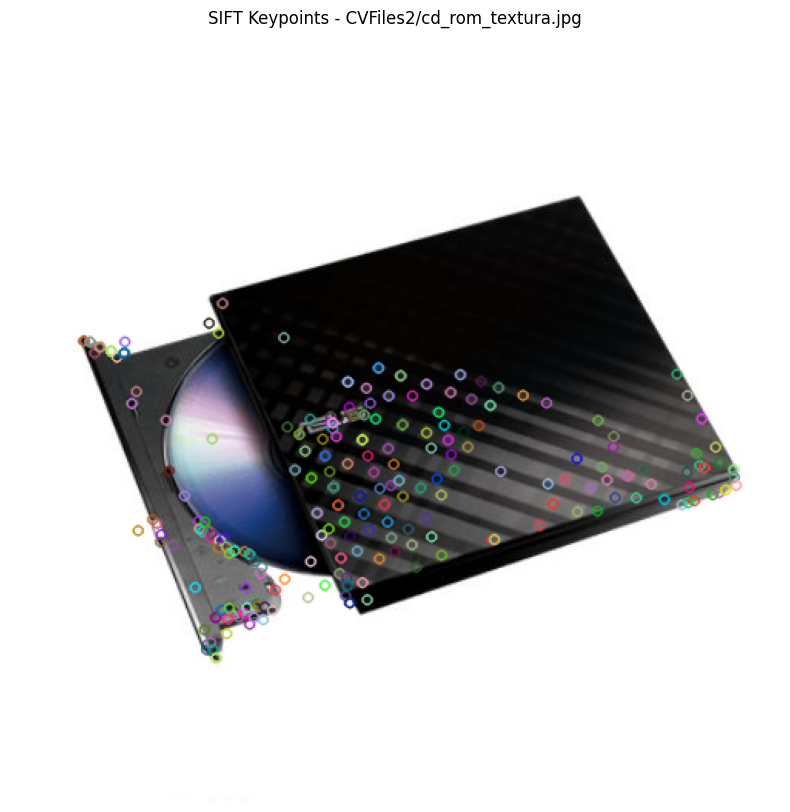

Saved image with keypoints as: sift_keypoints_cd_rom_textura.jpg


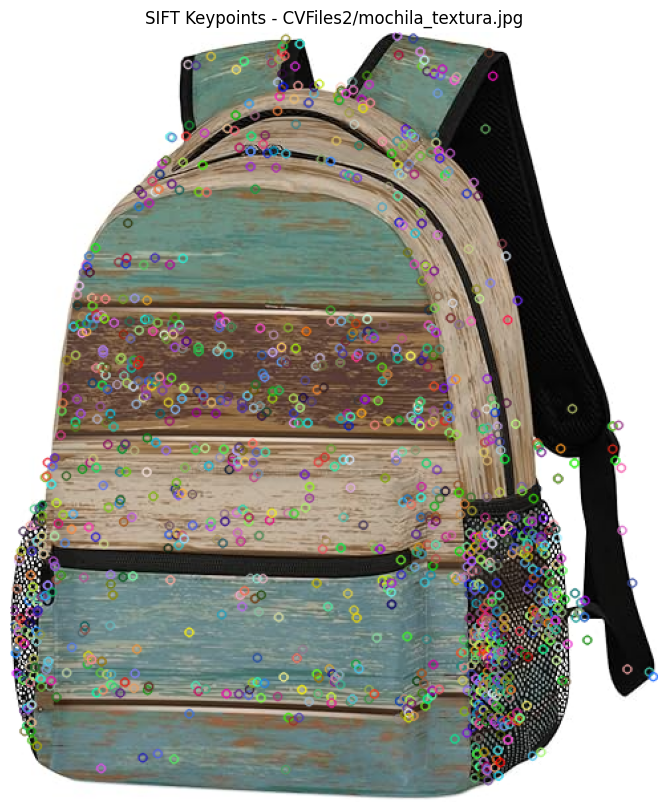

Saved image with keypoints as: sift_keypoints_mochila_textura.jpg

Image: CVFiles2/taza_textura.jpg
Número de keypoints detectados: 2383
Forma de descriptores: (2383, 128)

Image: CVFiles2/libro_textura.jpg
Número de keypoints detectados: 2424
Forma de descriptores: (2424, 128)

Image: CVFiles2/cd_rom_textura.jpg
Número de keypoints detectados: 267
Forma de descriptores: (267, 128)

Image: CVFiles2/mochila_textura.jpg
Número de keypoints detectados: 1486
Forma de descriptores: (1486, 128)


In [11]:
# Lista de rutas de archivos de imagen
image_paths = ['CVFiles2/taza_textura.jpg', 'CVFiles2/libro_textura.jpg', 'CVFiles2/cd_rom_textura.jpg', 'CVFiles2/mochila_textura.jpg']

# Procesar las imágenes
process_images(image_paths)

## <div style="background-color: #54c7ec; color: #fff; font-weight: 700; padding-left: 10px; padding-top: 5px; padding-bottom: 5px"><strong>RC3B:  (0.5 puntos)</strong></div>

 Añadir una serie de imágenes (al menos otras cuatro) de escenas en las que aparezcan algunos
 de los objetos, en posiciones diferentes, con posibles ocultaciones entre sí y con otros objetos, etc. Para
 cada una de ellas se extraerán igualmente las features SIFT y los descriptores correspondientes. Estos serán
 cruzados con los correspondientes a los modelos originales, usando cualquiera (o ambos, para comparar)
 de los métodos disponibles en OpenCV para esta tarea (cv2.BFMatcher o cv2.FlannBasedMatcher)

In [12]:
# Función para cargar una imagen
def load_image(image_path):
    img = cv2.imread(image_path)
    if img is None:
        print(f"Error al cargar la imagen: {image_path}")
        return None
    return img

In [13]:
# Función para extraer puntos clave y descriptores utilizando SIFT
def extract_sift_features(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)  # Convertir la imagen a escala de grises
    sift = cv2.SIFT_create()  # Inicializar el detector SIFT
    keypoints, descriptors = sift.detectAndCompute(gray, None)
    return keypoints, descriptors

In [14]:
# Función para almacenar puntos clave y descriptores en un diccionario
def store_features_in_dict(image_path, keypoints, descriptors, features_dict):
    features_dict[image_path] = {'keypoints': keypoints, 'descriptors': descriptors}

In [15]:
# Función para emparejar descriptores entre dos imágenes utilizando BFMatcher o FlannBasedMatcher
def match_descriptors(descriptors1, descriptors2, method='BF'):
    if method == 'BF':
        # Usando el emparejador de fuerza bruta (Brute Force) con KNN
        bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=False)
        matches = bf.knnMatch(descriptors1, descriptors2, k=2)  # Encontrar las dos mejores coincidencias
    elif method == 'FLANN':
        # Usando el emparejador basado en FLANN
        FLANN_INDEX_KDTREE = 0
        index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
        search_params = dict(checks=50)
        flann = cv2.FlannBasedMatcher(index_params, search_params)
        matches = flann.knnMatch(descriptors1, descriptors2, k=2)
    else:
        raise ValueError("El método debe ser 'BF' o 'FLANN'")

    return matches

In [16]:
# Función para aplicar el test de proporción (ratio test) y filtrar las mejores coincidencias
def apply_ratio_test(matches, ratio_thresh=0.7):
    good_matches = []
    for m, n in matches:
        if m.distance < ratio_thresh * n.distance:
            good_matches.append(m)
    return good_matches

In [17]:
# Función para dibujar y mostrar un número específico de coincidencias con un espacio entre imágenes
def draw_good_matches_with_space(img1, kp1, img2, kp2, matches, n_matches, space_width=30, line_thickness=4):
    # Seleccionar las mejores coincidencias usando el ratio test
    good_matches = apply_ratio_test(matches)

    # Crear un espacio en blanco entre las dos imágenes
    height1, width1 = img1.shape[:2]
    height2, width2 = img2.shape[:2]

    # Crear una imagen combinada con espacio en el centro
    img_matches = np.zeros((max(height1, height2), width1 + width2 + space_width, 3), dtype=np.uint8)

    # Colocar img1 a la izquierda e img2 a la derecha
    img_matches[:height1, :width1] = img1
    img_matches[:height2, width1 + space_width:] = img2

    # Dibujar las coincidencias en la imagen combinada con colores aleatorios y líneas más gruesas
    for match in good_matches[:n_matches]:  # Limitar a las mejores N coincidencias
        pt1 = (int(kp1[match.queryIdx].pt[0]), int(kp1[match.queryIdx].pt[1]))  # Posición del punto en img1
        pt2 = (int(kp2[match.trainIdx].pt[0]) + width1 + space_width, int(kp2[match.trainIdx].pt[1]))  # Posición en img2

        color = (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))  # Color aleatorio
        cv2.line(img_matches, pt1, pt2, color, line_thickness)  # Dibujar línea
        cv2.circle(img_matches, pt1, 5, color, -1)  # Dibujar círculo en img1
        cv2.circle(img_matches, pt2, 5, color, -1)  # Dibujar círculo en img2

    # Mostrar la imagen con las coincidencias
    plt.figure(figsize=(10, 10))
    plt.imshow(cv2.cvtColor(img_matches, cv2.COLOR_BGR2RGB))
    plt.title(f'{n_matches} mejores coincidencias')
    plt.axis('off')
    plt.show()

In [18]:
# Función principal para procesar múltiples imágenes
def process_images(image_paths1, image_paths2, matching_method='BF', n_matches=10, line_thickness=4):
    features_dict1 = {}  # Diccionario para almacenar características de la lista 1
    features_dict2 = {}  # Diccionario para almacenar características de la lista 2

    # Procesar las imágenes en ambas listas
    for image_path in image_paths1 + image_paths2:
        img = load_image(image_path)
        if img is None:
            continue  # Saltar si no se puede cargar la imagen

        keypoints, descriptors = extract_sift_features(img)  # Extraer características de SIFT
        if image_path in image_paths1:
            store_features_in_dict(image_path, keypoints, descriptors, features_dict1)
        else:
            store_features_in_dict(image_path, keypoints, descriptors, features_dict2)

    # Emparejar puntos clave entre las imágenes correspondientes
    for i in range(len(image_paths1)):
        img1_path = image_paths1[i]
        img2_path = image_paths2[i]

        img1 = load_image(img1_path)  # Cargar imagen 1
        img2 = load_image(img2_path)  # Cargar imagen 2

        kp1, des1 = features_dict1[img1_path]['keypoints'], features_dict1[img1_path]['descriptors']
        kp2, des2 = features_dict2[img2_path]['keypoints'], features_dict2[img2_path]['descriptors']

        matches = match_descriptors(des1, des2, method=matching_method)  # Relacionar descriptores

        draw_good_matches_with_space(img1, kp1, img2, kp2, matches, n_matches, line_thickness=line_thickness)

        print(f"Pares de imágenes: {img1_path} y {img2_path}")
        print(f"Imagen 1: {len(kp1)} puntos clave, Descriptores: {des1.shape if des1 is not None else 'Ninguno'}")
        print(f"Imagen 2: {len(kp2)} puntos clave, Descriptores: {des2.shape if des2 is not None else 'Ninguno'}")
        print("=" * 50)

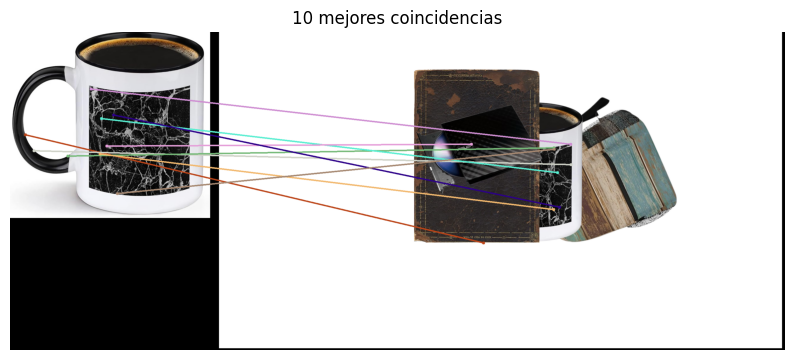

Pares de imágenes: CVFiles2/taza_textura2.jpg y CVFiles2/mochila_taza_oculta.png
Imagen 1: 2701 puntos clave, Descriptores: (2701, 128)
Imagen 2: 2129 puntos clave, Descriptores: (2129, 128)


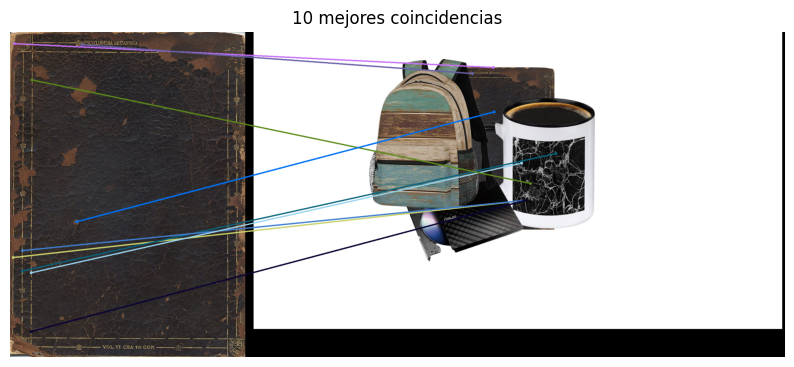

Pares de imágenes: CVFiles2/libro_textura.jpg y CVFiles2/libro_oculto.png
Imagen 1: 2424 puntos clave, Descriptores: (2424, 128)
Imagen 2: 2938 puntos clave, Descriptores: (2938, 128)


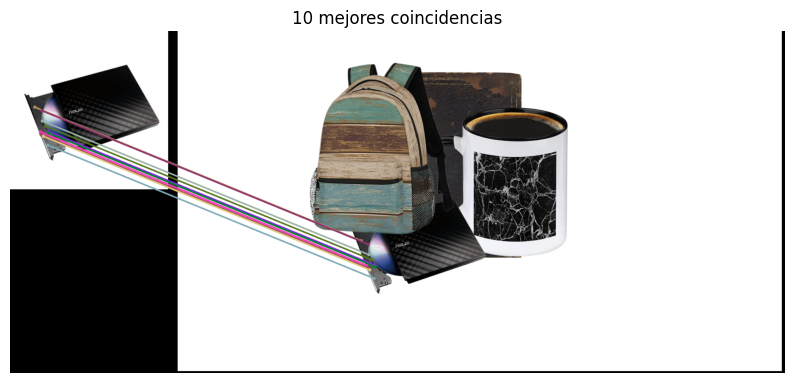

Pares de imágenes: CVFiles2/cd_rom_textura.jpg y CVFiles2/libro_oculto.png
Imagen 1: 267 puntos clave, Descriptores: (267, 128)
Imagen 2: 2938 puntos clave, Descriptores: (2938, 128)


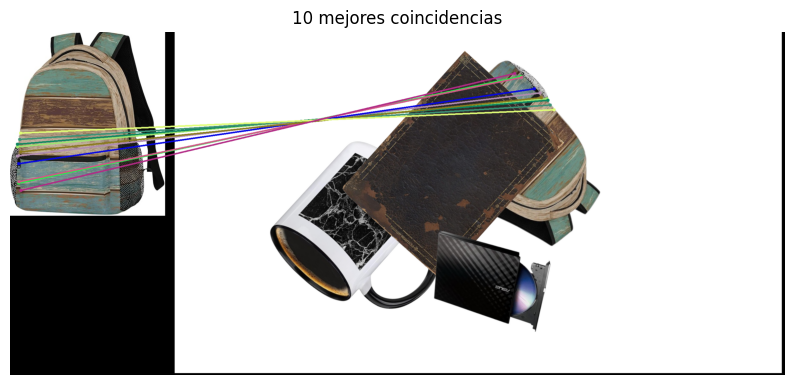

Pares de imágenes: CVFiles2/mochila_textura.jpg y CVFiles2/mochila_taza_libro_oculta.png
Imagen 1: 1486 puntos clave, Descriptores: (1486, 128)
Imagen 2: 2506 puntos clave, Descriptores: (2506, 128)


In [19]:
#Lista de rutas de archivos de imagen
image_paths1  = ['CVFiles2/taza_textura2.jpg', 'CVFiles2/libro_textura.jpg', 'CVFiles2/cd_rom_textura.jpg', 'CVFiles2/mochila_textura.jpg']

image_paths2 = ['CVFiles2/mochila_taza_oculta.png', 'CVFiles2/libro_oculto.png', 'CVFiles2/libro_oculto.png', 'CVFiles2/mochila_taza_libro_oculta.png']

# Número de buenas coincidencias para mostrar
n_matches = 10

# Procese las imágenes de ambas listas usando BF o FLANN Matcher y líneas más gruesas
process_images(image_paths1, image_paths2, matching_method='FLANN', n_matches=n_matches, line_thickness=3)


## <div style="background-color: #54c7ec; color: #fff; font-weight: 700; padding-left: 10px; padding-top: 5px; padding-bottom: 5px"><strong>RC3C:  (0.5 puntos)</strong></div>

Para aquellos modelos para los que se detecte una cantidad de matchings suficiente, se
 estimará con la debida robustez (usando la técnica RANSAC) la transformación afín existente entre la
 imagen del modelo detectado y la imagen de la escena. Este punto se podrá realizar utilizando como cajas
 negras las funciones cv2.findHomography, cv2.estimateAffine2D y/o cv2.estimateAffinePartial2D,
 o, alternativamente, cualquiera de las alternativas disponibles en el módulo skimage.transform. Una vez
 determinada dicha transformación afín, se ha de dibujar a partir de ella el cuadrángulo de la imagen
 modelo convenientemente mapeado sobre la imagen de la escena. Además, justo en el centro de dicho
 paralelogramo se debe mostrar el nombre de la imagen del modelo con la que se ha realizado el matching-es decir, del objeto detectado-. El proceso se debe repetir por separado para cada objeto, para el caso de
 múltiples objetos detectados.

In [20]:
def estimate_and_draw_transform(image_paths1, image_paths2):
    # Crear un detector de características SIFT
    sift = cv2.SIFT_create()

    # FLANN: parámetros para la búsqueda rápida de vecinos más cercanos
    FLANN_INDEX_KDTREE = 1  # Usamos KD-Tree para búsqueda rápida en FLANN
    index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=10)
    search_params = dict(checks=50)

    # Iterar sobre las imágenes de ambas listas
    for i in range(len(image_paths1)):
        # Cargar las imágenes del objeto y la escena
        object_img = cv2.imread(image_paths1[i])
        scene_img = cv2.imread(image_paths2[i])

        # Convertir las imágenes a escala de grises (SIFT funciona en escala de grises)
        object_gray = cv2.cvtColor(object_img, cv2.COLOR_BGR2GRAY)
        scene_gray = cv2.cvtColor(scene_img, cv2.COLOR_BGR2GRAY)

        # Detectar puntos clave y descriptores en ambas imágenes con SIFT
        kp_object, des_object = sift.detectAndCompute(object_gray, None)
        kp_scene, des_scene = sift.detectAndCompute(scene_gray, None)

        # Emparejador FLANN
        flann = cv2.FlannBasedMatcher(index_params, search_params)

        # Emparejar los descriptores entre el objeto y la escena
        matches = flann.knnMatch(des_object, des_scene, k=2)

        # Aplicar el ratio test de Lowe para filtrar las mejores coincidencias
        good_matches = []
        for m, n in matches:
            if m.distance < 0.7 * n.distance:
                good_matches.append(m)

        # Si hay suficientes matches, estimar la transformación afín o homografía
        if len(good_matches) >= 10:
            # Puntos correspondientes (del objeto y la escena)
            src_pts = np.float32([kp_object[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
            dst_pts = np.float32([kp_scene[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)

            # Estimación de la homografía (más robusta en presencia de distorsiones)
            H, mask = cv2.findHomography(src_pts, dst_pts, method=cv2.RANSAC, ransacReprojThreshold=4)

            # Si no se puede estimar una homografía válida, usar transformación afín
            if H is None:
                print(f"No se pudo estimar la homografía entre {image_paths1[i]} y {image_paths2[i]}")
                M, _ = cv2.estimateAffine2D(src_pts, dst_pts)
                if M is None:
                    print(f"No se pudo estimar la transformación afín entre {image_paths1[i]} y {image_paths2[i]}")
                    continue
                # Usar la transformación afín (sin homografía)
                transformed_conners = apply_affine_transformation(M, object_img)
            else:
                # Usar la homografía estimada
                transformed_conners = apply_homography_transformation(H, object_img)

            # Copiar la imagen de la escena para dibujar el cuadrángulo mapeado
            scene_image_width_box = scene_img.copy()

            # Dibujar el cuadrángulo transformado sobre la escena
            transformed_conners = np.int32(transformed_conners)
            cv2.polylines(scene_image_width_box, [transformed_conners], isClosed=True, color=(0, 255, 0), thickness=3)

            # Calcular el centro del paralelogramo (cuadrángulo transformado) para colocar el texto
            center_x = int(np.mean(transformed_conners[:, 0, 0]))
            center_y = int(np.mean(transformed_conners[:, 0, 1]))

            # Obtener el nombre del objeto (quitar la extensión del archivo)
            object_name = os.path.basename(image_paths1[i])

            # Dibujar el texto centrado
            draw_centered_text(scene_image_width_box, (center_x, center_y), os.path.splitext(object_name)[0])

            # Mostrar el resultado
            scene_image_rgb = cv2.cvtColor(scene_image_width_box, cv2.COLOR_BGR2RGB)  # Convertir a RGB
            plt.figure(figsize=(10, 8))
            plt.title(f"Objeto detectado: {object_name} en {image_paths2[i]}")
            plt.imshow(scene_image_rgb)
            plt.axis('off')
            plt.show()
        else:
            print(f"No hay suficientes matches entre {image_paths1[i]} y {image_paths2[i]}")

In [21]:
def apply_affine_transformation(M, object_img):
    """
    Función para aplicar la transformación afín a los vértices del objeto.
    """
    h, w = object_img.shape[:2]
    conners = np.float32([[0, 0], [w, 0], [w, h], [0, h]]).reshape(-1, 1, 2)
    transformed_conners = cv2.transform(conners, M)
    return transformed_conners

In [22]:
def apply_homography_transformation(H, object_img):
    """
    Función para aplicar la homografía a los vértices del objeto.
    """
    h, w = object_img.shape[:2]
    conners = np.float32([[0, 0], [w, 0], [w, h], [0, h]]).reshape(-1, 1, 2)
    transformed_conners = cv2.perspectiveTransform(conners, H)
    return transformed_conners

In [23]:
def draw_centered_text(image, position, text):
    """
    Función para dibujar texto centrado en las coordenadas dadas.
    """
    font = cv2.FONT_HERSHEY_SIMPLEX
    font_scale = 1
    font_color = (255, 255, 255)  # Blanco
    thickness = 2

    # Obtener el tamaño del texto
    text_size = cv2.getTextSize(text, font, font_scale, thickness)[0]
    text_width = text_size[0]
    text_height = text_size[1]

    # Calcular la posición para centrar el texto
    text_x = position[0] - text_width // 2
    text_y = position[1] + text_height // 2

    # Colocar el texto sobre la imagen
    cv2.putText(image, text, (text_x, text_y), font, font_scale, font_color, thickness)


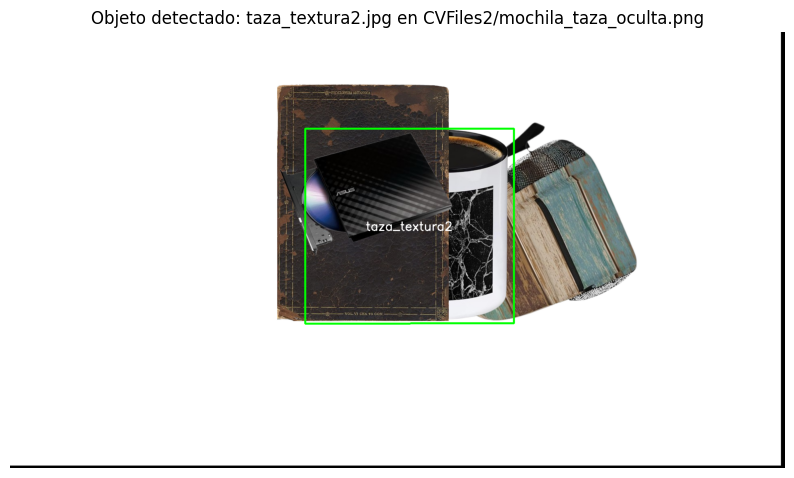

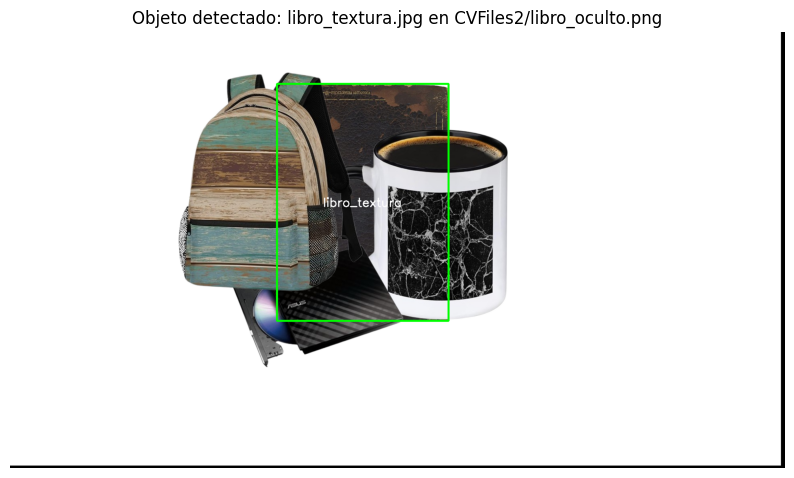

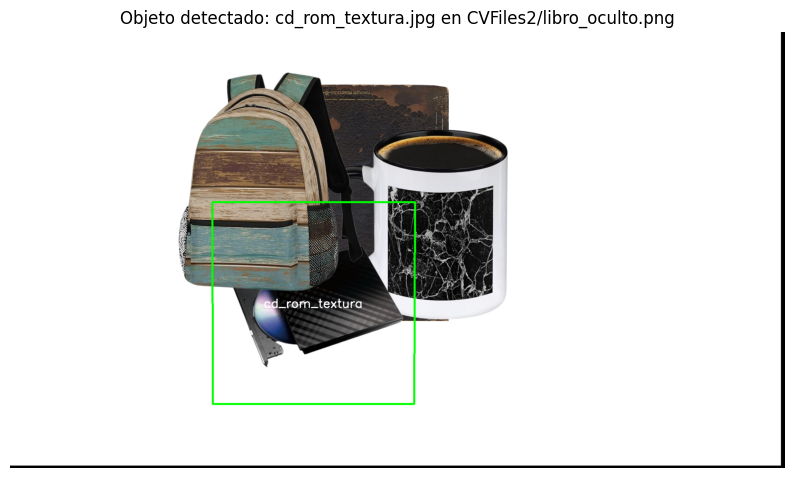

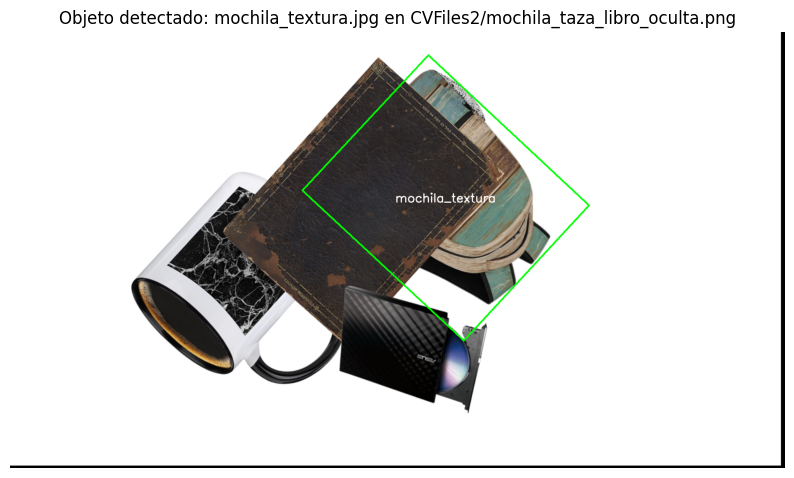

In [24]:
image_paths1 = ['CVFiles2/taza_textura2.jpg', 'CVFiles2/libro_textura.jpg', 'CVFiles2/cd_rom_textura.jpg', 'CVFiles2/mochila_textura.jpg']

image_paths2 = ['CVFiles2/mochila_taza_oculta.png', 'CVFiles2/libro_oculto.png', 'CVFiles2/libro_oculto.png', 'CVFiles2/mochila_taza_libro_oculta.png']

estimate_and_draw_transform(image_paths1, image_paths2)

## <div style="background-color: #54c7ec; color: #fff; font-weight: 700; padding-left: 10px; padding-top: 5px; padding-bottom: 5px"><strong>Ejercicio OP3E (0.4 pts)</strong></div>

Realizar una implementación manual en python del Operador de detección de bordes de Canny, usando las primitivas de procesamiento de OpenCV / numpy / skimage que se consideren necesarias  
(aunque, obviamente, sin usar las funciones de dichas librerías que implementan directamente el método).

### **Planteamiento del ejercicio**

EL Operador de Canny que vamos a implementar como función, actúa secuancialmente de la siguiente forma:

0. (Opcional con resize=True) - Resizing de la imagen para que tenga un tamaño contenido y poder hacer pruebas de concepto con mayor fluidez
1. Convertir la imagen a escala de gris
2. Suavizado de la imagen binaria con un filtro gaussiano
3. Obtención de derivadas direccionales (locales) pixel a pixel con operador de Sobel
4. Estimación del módulo y dirección del gradiente a partir de las derivadas direccionales pixel a pixel
5. Umbralizado del módulo del gradiente
6. Supresión de no-máximos según la dirección del gradiente
7. Histéresis

* Extra 1: La función devuelve la imagen binarizada con bordes
* Extra 2: La función devuelve una lista de coordenadas $(y,x)$ en las que se encuentran los puntos de borde (tras la histéresis) sobre la imagen de entrada
* Extra 3: Al poner ``showAll=True`` también se muestran por pantalla 3 imágenes: la original, la imagen binarizada con Canny aplicado, y una superposición de los gradientes  
obtenidos en el paso 4. sobre la imagen original



### **Resolución**

In [25]:
def custom_Canny(image, low_threshold=50, high_threshold=150, resize=True, showAll=True):

    """
    Implementación manual del operador de detección de bordes de Canny.

    Args:
        image: ndarray, imagen de entrada en escala de grises.
        low_threshold: int, umbral bajo para la histéresis.
        high_threshold: int, umbral alto para la histéresis.
        resize: bool, si True redimensiona la imagen a un tamaño manejable.
        showAll: bool, si True muestra imágenes intermedias y resultados.

    Returns:
        edges: Imagen binaria resultante tras aplicar Canny.
        edge_points: Lista de coordenadas (x, y) de los puntos de borde.
    """

    # Paso 0: Redimensionar (opcional)
    if resize:
        height, width = image.shape[:2]
        scale = min(512 / max(height, width), 1.0)                              # Definimos el resize a una escala que deje la imagen con tamaño 512x512 o con tamaño de entrada si resulta menor
        image = cv2.resize(image, (int(width * scale), int(height * scale)))    # Aplicamos el resize

    # Paso 1: Convertir a escala de gris (si no está ya en escala de grises)
    if len(image.shape) == 3:
        gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        gray_image = image

    # Paso 2: Suavizado con filtro Gaussiano que ponemos por defecto como máscara de tamaño 5x5 y sigma=1.4
    blurred_image = cv2.GaussianBlur(gray_image, (5, 5), 1.4)

    # Paso 3: Derivadas direccionales (Sobel)
    grad_x = cv2.Sobel(blurred_image, cv2.CV_64F, 1, 0, ksize=3)    # ---> (imagen, tipo de dato de salida, Multiplicador del gradiente en X, Multiplicador del gradiente en Y, tamaño del kernel)
    grad_y = cv2.Sobel(blurred_image, cv2.CV_64F, 0, 1, ksize=3)

    # Paso 4: Módulo y dirección del gradiente a partir de las derivadas direccionales
    gradient_magnitude = np.sqrt(grad_x**2 + grad_y**2)
    gradient_direction = np.arctan2(grad_y, grad_x) * (180 / np.pi) % 180   # Conversión de los ángulos en el intervalo [0,2*pi] al intervalo [0,180] identificando ángulos alpha entre 180 y 360
                                                                            # como alpha - 180

    # Paso 5: Umbralización del módulo del gradiente, teniendo en cuenta que un gradiente máximo es 255 y mínimo 0. Seleccionamos los gradientes fuertes y suaves, para poder realizar luego
    #         el proceso de Histéresis
    strong_edges = (gradient_magnitude > high_threshold)
    weak_edges = (gradient_magnitude >= low_threshold) & ~strong_edges

    # Paso 6: Supresión de no-máximos
    nms_image = np.zeros_like(gradient_magnitude, dtype=np.uint8)   # Inicializamos una matriz de ceros (imagen en negro) del tamaño de la imagen original
    angles = gradient_direction                                     # definimos una lista de angulos del gradiente asociados a cada punto de la imagen

    for i in range(1, gradient_magnitude.shape[0] - 1):             # Iteramos sobre coordenada X e Y para obtener el angulo del gradiente asociado
        for j in range(1, gradient_magnitude.shape[1] - 1):
            angle = angles[i, j]
            q, r = 255, 255  # Valores por defecto

            if (0 <= angle < 22.5) or (157.5 <= angle <= 180):      # Establecemos un criterio de comparación en fuinción de lo inclinado que está el gradiente que recorremos en el doble bucle
                q = gradient_magnitude[i, j + 1]                    # Coorenadas en formato (Y,X)
                r = gradient_magnitude[i, j - 1]                    # Si es casi horizontal, comparamos la magnitud del gradiente con la de los dos pixeles más cercanos en horizontal
            elif 22.5 <= angle < 67.5:
                q = gradient_magnitude[i + 1, j - 1]                # Si subo en poco de lo casi horizontal, comparamos la magnitud del gradiente con la de los dos pixeles más cercanos "en diagonal"
                r = gradient_magnitude[i - 1, j + 1]
            elif 67.5 <= angle < 112.5:
                q = gradient_magnitude[i + 1, j]
                r = gradient_magnitude[i - 1, j]
            elif 112.5 <= angle < 157.5:
                q = gradient_magnitude[i - 1, j - 1]                # Si es casi vertical, comparamos la magnitud del gradiente con la de los dos pixeles más cercanos en vertical
                r = gradient_magnitude[i + 1, j + 1]

            if (gradient_magnitude[i, j] >= q) and (gradient_magnitude[i, j] >= r):     # Si el punto sobre el que comparamos tiene mayor gradiente que sus puntos vecinos, será un punto de
                nms_image[i, j] = gradient_magnitude[i, j]                              # gradiente máximo (a nivel local)

    # Paso 7: Histéresis
    hysteresis_image = np.zeros_like(nms_image)     # Comenzamos con un fondo en negro
    strong_i, strong_j = np.where(strong_edges)     # ubicamos las coordenadas con un fuerte gradiente
    weak_i, weak_j = np.where(weak_edges)           # ubicamos las coordenadas con un gradiente suave

    hysteresis_image[strong_i, strong_j] = 255      # ponemos a 255 (blanco) los pixeles de las coordenadas con un alto gradiente

    for i, j in zip(weak_i, weak_j):                                        # Recorriendo los puntosd e borde suave:
        if np.any(hysteresis_image[i - 1:i + 2, j - 1:j + 2] == 255):       # Miramos cerca de los puntos de gradiente suave por si encontramos un punto de gradeinte fuerte
            hysteresis_image[i, j] = 255                                    # Si es así, ponemos a 255 el punto de gradiente suave sobre el que estamos checkeando

    # Generar resultados
    edge_points = np.column_stack(np.where(hysteresis_image == 255))
    edges = hysteresis_image.astype(np.uint8)

    # Visualización (opcional)
    if showAll:
        plt.figure(figsize=(15, 5))
        plt.subplot(1, 3, 1)
        plt.title("Imagen Original")
        plt.imshow(image, cmap="gray")
        plt.axis("off")

        plt.subplot(1, 3, 2)
        plt.title("Bordes Canny")
        plt.imshow(edges, cmap="gray")
        plt.axis("off")


        plt.subplot(1, 3, 3)
        plt.title("Superposición de Gradientes")

        if len(image.shape) == 3:

            #plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
            plt.imshow(image)


        else:

            plt.imshow(image, cmap="gray")


        # Para mostrar la imagen con representación de los gradientes:
        plt.quiver(
            edge_points[:, 1],
            edge_points[:, 0],
            grad_x[edge_points[:, 0], edge_points[:, 1]],
            grad_y[edge_points[:, 0], edge_points[:, 1]],
            color="red",
            scale=9000,  # Escala ajustada para flechas pequeñas
            scale_units="xy",
            angles="xy",
            width=0.002  # Grosor reducido para las flechas

        )

        plt.axis("off")

        plt.show()


    return edges, edge_points


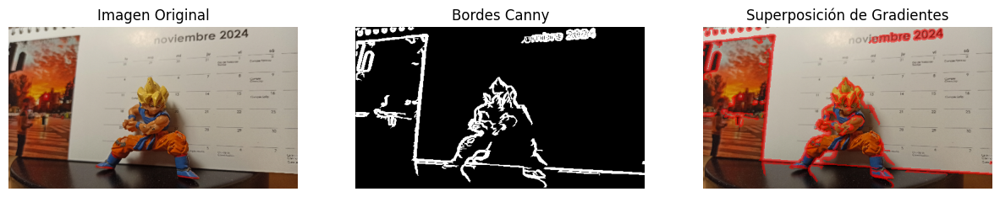

In [26]:
my_image = cv2.imread('CVFiles2/goku.jpg')
b,g,r = cv2.split(my_image)           # guardamos b, g, r
my_image = cv2.merge([r,g,b])         # cambiamos a r, g, b

edges , edge_points = custom_Canny(my_image, low_threshold=50, high_threshold=150)

### ``Comentarios:``

Podemos observar que los bordes se detectan bastante bien, salgo los de la pirena izquierda del muñeco, porque parece coincidir bastante la iluminación de esa parte con la del fondo (tono grisaceo). Por otra parte, los bordes son algo gruesos y quizá modificando el criterio de histéresis opdamos hacerlos más finos (en el código vemos que hemos mirado en los vecinos a distancia 1 por arriba y por la derecha; y 2 por izquierda y por debajo. Podríamos haber tomado distancia 1 en cualquier caso por ejemplo).

Notamos también como influye la elección del fondo blanco o negro para la calidad del cálculo de gradientes: donde el fonodo se pone algo gris por el sombreado del muñeco, desaparecen los puntos de borde o se disminuyen porque el gradiente se hace 0 en esa región o en buena parte de ella.

### ``Pruebas adicionales:``

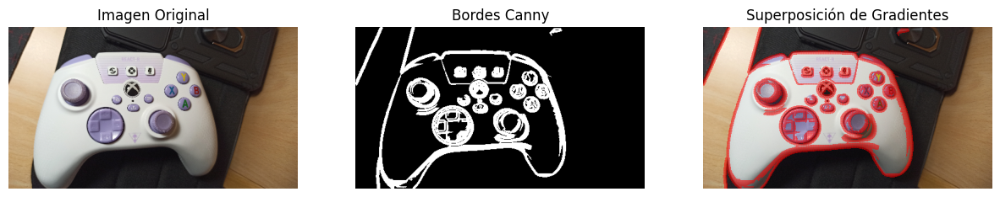

In [27]:
my_image = cv2.imread('CVFiles2/controller.jpg')
b,g,r = cv2.split(my_image)           # guardamos b, g, r
my_image = cv2.merge([r,g,b])         # cambiamos a r, g, b

edges , edge_points = custom_Canny(my_image, low_threshold=35, high_threshold=130)

Podemos ver que el somrbeado en la parte baja del mando jeuga malas pasadas a los gradientes y por tanto a la detección de bordes "artificiales". También, si probamos a bajar el umbral minimo y el máximo, podemos conseguir que se detecten bordes más sombreados como lo que genera el fondo negro con la parte marrón de la derecha.

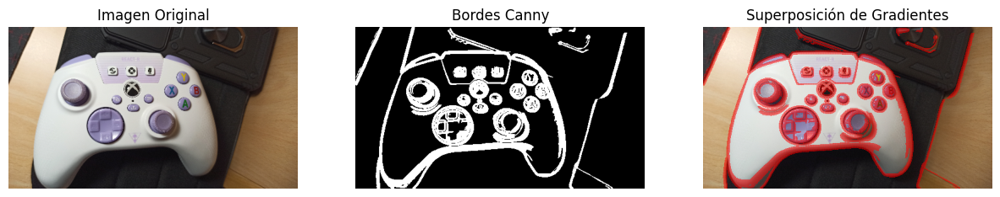

In [28]:
my_image = cv2.imread('CVFiles2/controller.jpg')
b,g,r = cv2.split(my_image)           # guardamos b, g, r
my_image = cv2.merge([r,g,b])         # cambiamos a r, g, b

edges , edge_points = custom_Canny(my_image, low_threshold=30, high_threshold=85)

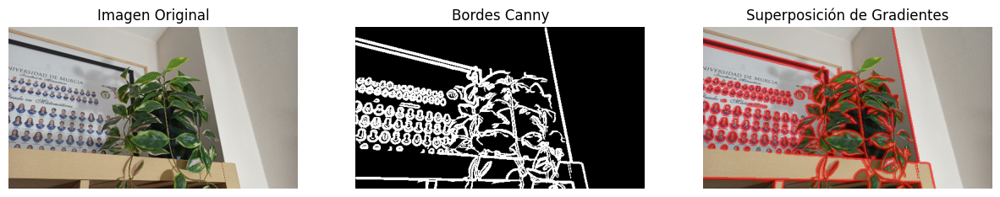

In [29]:
my_image = cv2.imread('CVFiles2/planta.jpg')
b,g,r = cv2.split(my_image)           # guardamos b, g, r
my_image = cv2.merge([r,g,b])         # cambiamos a r, g, b

edges , edge_points = custom_Canny(my_image, low_threshold=50, high_threshold=150)

Aquí podemos ver cómo el fondo blanco de la orla facilita la detección de bordes en las fotos de los alumnos, y cómo el sombreado de la parte alta de la pared confunce al operador para que no muestr el borde asociado a la hoja más alta de la planta. Podemos conseguir que la detecte con un ajuste de umbrales de gradiente:

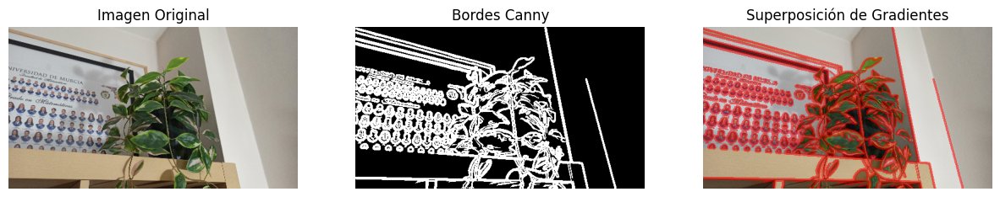

In [30]:
my_image = cv2.imread('CVFiles2/planta.jpg')
b,g,r = cv2.split(my_image)           # guardamos b, g, r
my_image = cv2.merge([r,g,b])         # cambiamos a r, g, b

edges , edge_points = custom_Canny(my_image, low_threshold=40, high_threshold=80)

Lo malo de esto es que hay más bordes en general, y hay muchos nuevos muy cercanos a los bordes de la prueba uinmediatamente anterior. Esto hace que la imagen de bordes binaria sea más difícil de interpretar (nos dificulta estimar la forma exacta del objeto).

## <div style="background-color: #54c7ec; color: #fff; font-weight: 700; padding-left: 10px; padding-top: 5px; padding-bottom: 5px"><strong>Ejercicio OP3F (0.3 pts)</strong></div>

Ídem a OP3E, pero para el operador de detección de esquinas de Harris.

### **Planteamiento del ejercicio**

EL Operador de Harris que vamos a implementar como función, actúa secuancialmente de la siguiente forma:

0. (Opcional con resize=True) - Resizing de la imagen para que tenga un tamaño contenido y poder hacer pruebas de concepto con mayor fluidez
1. Convertir la imagen a escala de gris
2. Suavizado de la imagen binaria con un filtro gaussiano
3. Estudio de valores de gradiente en entornos locales (pixel a pixel) recogiendo los resultado en la matriz de gradientes asociada a cada coordenada
4. Estudio de valores y vectores propios de la matriz de gradientes para detección de esquinas (teniendo en cuenta que los puntos de esquina se caracterizan como aquellos puntos donde los valores propios de la matriz Hessiana asociada son ambos *suficientemente grandes*)

* Extra 1: Añadir ANMS (Adaptive Non-maximal Suppression)
* Extra 2: La función devuelve una lista de coordenadas $(y,x)$ en las que se encuentran los puntos de esquina sobre la imagen de entrada
* Extra 3: Al poner ``showAll=True`` también se muestran por pantalla 3 imágenes: la original, una superposición de los puntos esquina sobre la imagen original y un mapa de calor de la imagen en base al operador de la media armónica de valores propios de la matriz de gradientes



### **Resolución**

In [31]:
def custom_Harris(image, radius=10, threshold=1e-5, resize=True, showAll=True):
    """
    Implementación manual del operador de detección de esquinas de Harris.

    Args:
        image: ndarray, imagen de entrada en escala de grises o color.
        k: float, parámetro de sensibilidad del detector (Harris).
        threshold: float, umbral mínimo para considerar un punto como esquina.
        resize: bool, si True redimensiona la imagen a un tamaño manejable.
        showAll: bool, si True muestra las imágenes intermedias y resultados.

    Returns:
        corners: Lista de coordenadas (y, x) de las esquinas detectadas.
    """
    # Paso 0: Redimensionar (opcional)
    if resize:
        height, width = image.shape[:2]
        scale = min(512 / max(height, width), 1.0)
        image = cv2.resize(image, (int(width * scale), int(height * scale)))

    original_image = image.copy()

    # Paso 1: Convertir a escala de grises si la imagen es a color
    if len(image.shape) == 3:
        gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        gray_image = image

    # Paso 2: Suavizado con filtro Gaussiano
    gray_image = gray_image.astype(np.float32)  # Convertir a flotante para evitar errores
    blurred_image = cv2.GaussianBlur(gray_image, (5, 5), 1.4)

    # Paso 3: Gradientes direccionales con Sobel
    grad_x = cv2.Sobel(blurred_image, cv2.CV_64F, 1, 0, ksize=3)    # grad_x es una matriz igual de grande que la imagen original, que contiene el gradiente en X en cada pixel de la imagen orig.
    grad_y = cv2.Sobel(blurred_image, cv2.CV_64F, 0, 1, ksize=3)    # grad_y ...

    # Cálculo de productos de gradiente (Usando Operaciones con matrices element-wise)
    Ixx = grad_x ** 2
    Iyy = grad_y ** 2
    Ixy = grad_x * grad_y

    # Paso 4: Matriz de gradientes (ventanas locales)
    # Aplicar filtro gaussiano a los productos
    Sxx = cv2.GaussianBlur(Ixx, (5, 5), 1.4)
    Syy = cv2.GaussianBlur(Iyy, (5, 5), 1.4)
    Sxy = cv2.GaussianBlur(Ixy, (5, 5), 1.4)

    # Calculamos el Determinante y la traza de la matriz (basándonos en la diapositiva 46)
    det_H = (Sxx * Syy) - (Sxy ** 2)
    trace_H = Sxx + Syy

    # Respuesta de Harris (media armónica de los valores propios)
    epsilon = 1e-8  # Evitar divisiones por cero
    R = det_H /(trace_H + epsilon)

    # Normalizamos los valores de respuesta en cada pixel para tener un criterio de comparación de respuesta que se adapte a cada imagen
    R_normalized = cv2.normalize(R, None, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX)

    # Paso 5: Umbralización para esquinas
    initial_corners = np.argwhere(R_normalized > threshold)
    initial_corners = [(y, x) for y, x in initial_corners]  # Sacamos lista de tuplas que indica los pixeles con esquina

    # Extra 1: Adaptive Non-Maximal Suppression (ANMS) basado en radio
    corners = []
    suppressed = np.zeros_like(R, dtype=bool)                                           # Marcamos los píxeles suprimidos
    for y, x in sorted(initial_corners, key=lambda c: R[c[0], c[1]], reverse=True):     # Ordenamos de mayor a menor por valor de la respuesta
        if not suppressed[y, x]:                                                        # Si el pixel no está suprimido
            corners.append((y, x))                                                      # Lo tomamos como esquina
                                                                                        # Y lo usamos de centro para suprimir por radio:
            y_min = max(0, y - radius)                                                      # Controlamos que los problemas de indexación por tamaño de la imagen
            y_max = min(R.shape[0], y + radius + 1)
            x_min = max(0, x - radius)
            x_max = min(R.shape[1], x + radius + 1)
            suppressed[y_min:y_max, x_min:x_max] = True                                 # Se suprimen todos los pixeles en el interior del radio centrado en el pixel de esquina


    # Extra 2 y 3: Mostrar imágenes
    if showAll:
        plt.figure(figsize=(18, 5))

        # Imagen original
        plt.subplot(1, 3, 1)
        plt.title("Imagen Original")
        if len(original_image.shape) == 3:
            plt.imshow(original_image)
        else:
            plt.imshow(original_image, cmap="gray")
        plt.axis("off")

        # Superposición de esquinas
        plt.subplot(1, 3, 2)
        overlay = original_image.copy()
        for y, x in corners:
            cv2.circle(overlay, (x, y), 3, (0, 255, 0), -1)
        if len(overlay.shape) == 3:
            plt.imshow(overlay)
        else:
            plt.imshow(overlay, cmap="gray")
        plt.title(f"Esquinas Detectadas (radius={radius} , threshold={threshold})")
        plt.axis("off")

        # Mapa de calor
        plt.subplot(1, 3, 3)
        plt.title("Heatmap del operador Respuesta")
        plt.imshow(R_normalized, cmap="hot")
        plt.colorbar()
        plt.axis("off")

        plt.show()

    return corners



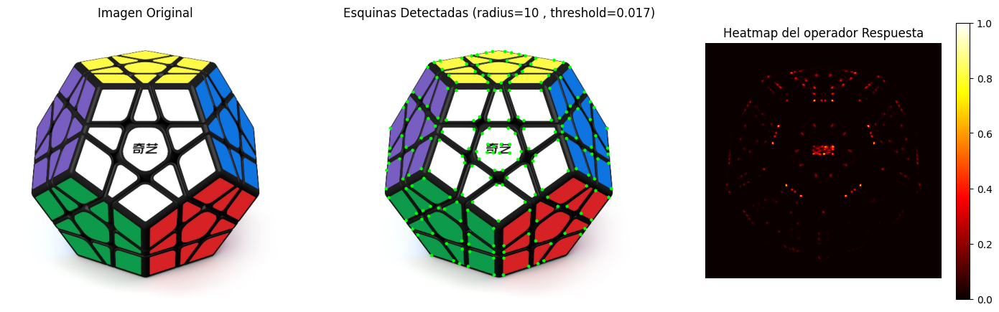

In [32]:
my_image = cv2.imread('CVFiles2/megaminx.jpg')
b,g,r = cv2.split(my_image)           # guardamos b, g, r
my_image = cv2.merge([r,g,b])         # cambiamos a r, g, b

corners = custom_Harris(my_image, threshold=0.017)

### ``Comentarios:``
Podemos observar que los puntos de esquina se detectan muy bien si ajustamos correctamente el umbral de aceptación de la respuesta de Harris, incluso para el valor estándar del radio de supresión (10 pixeles). Podemos jugar también condistintos valores de este radio para ajustar la supresión en función de nuestras necesidades, aunque de forma estándar funciona suficientemente bien. Es cierto que hay algunas esquinas que no detecta, pero a lo mejor estamos hablando de una precisión de entre el 80% y el 95% dependiende de lo complicada que sea la imagen de entrada en cuanto a tenes esquinas bien definidas (incluso para el ojo humano).

### ``Pruebas adicionales:``

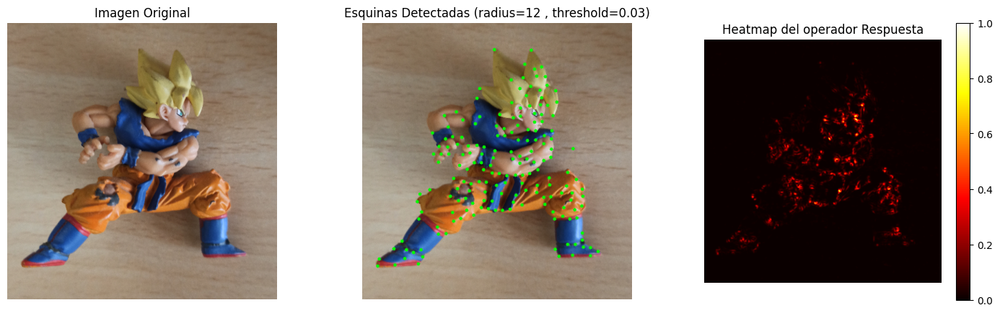

In [33]:
my_image = cv2.imread('CVFiles2/goku2.jpg')
b,g,r = cv2.split(my_image)           # guardamos b, g, r
my_image = cv2.merge([r,g,b])         # cambiamos a r, g, b

corners = custom_Harris(my_image, radius=12, threshold=0.03)

Contenemos bien las texturas del fondo con este ajuste de parámetros, pero como veremos a continuación, si ponemos el umbral más bajo y disminuimos el radio de supresión, aparecerán esquinas en las texturas del fondo e incluso en las texturas de la "ropa" del muñeco:

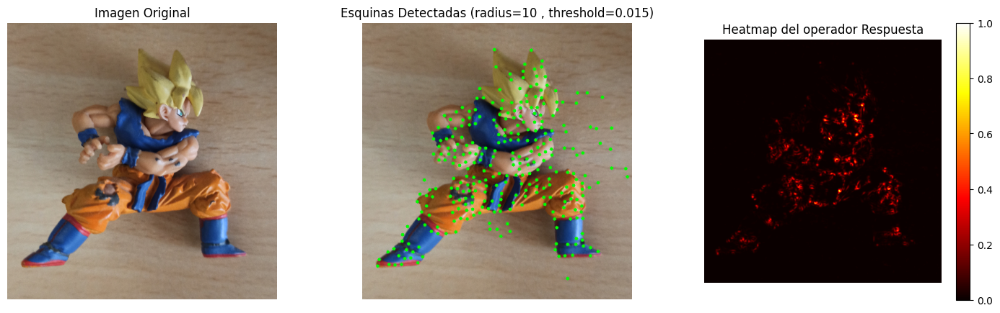

In [34]:
my_image = cv2.imread('CVFiles2/goku2.jpg')
b,g,r = cv2.split(my_image)           # guardamos b, g, r
my_image = cv2.merge([r,g,b])         # cambiamos a r, g, b

corners = custom_Harris(my_image, radius=10, threshold=0.015)

Lo malo es que al hacer esto perdemos precisión en la detección de esquinas en general. Hay algunos lugares donde el algoritmo detecta esquinas pero visualmente nosotros vemos lineas casi rectas o curvas. Por ejemplo, esto sucede en la suela del pie derecho del muñeco. Por otro lado, al aumentar la "sensibilidad del algoritmo" hemos detectado esquinas en la textura del fondo. Hemos de tener en cuenta que esta foto está recortada sobre otra foto original, y quizá el tamaño en pixeles sea más pequeño que las anteriores. Por ello hemos de tener cuidado con el parámetro ``radius`` y no ajustyarlo comparando con el caso anterior.

Vamos a hacer una prueba más con una imagen real tomada por mí mismo en casa

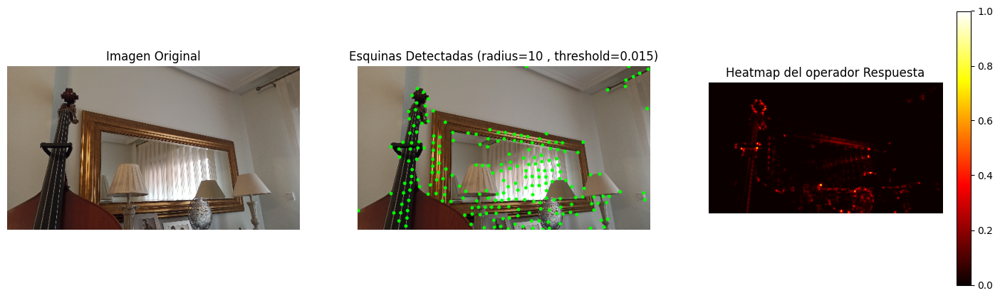

In [35]:
my_image = cv2.imread('CVFiles2/salon.jpg')
b,g,r = cv2.split(my_image)           # guardamos b, g, r
my_image = cv2.merge([r,g,b])         # cambiamos a r, g, b

corners = custom_Harris(my_image, radius=10, threshold=0.015)

Detecta muchas esquinas en sitios insospechados, así que podemos subir el umbral para que por ejemplo, no detecte como esquinas las cuerdas del contrabajo. El radio de supresión sí que parece adecuado.

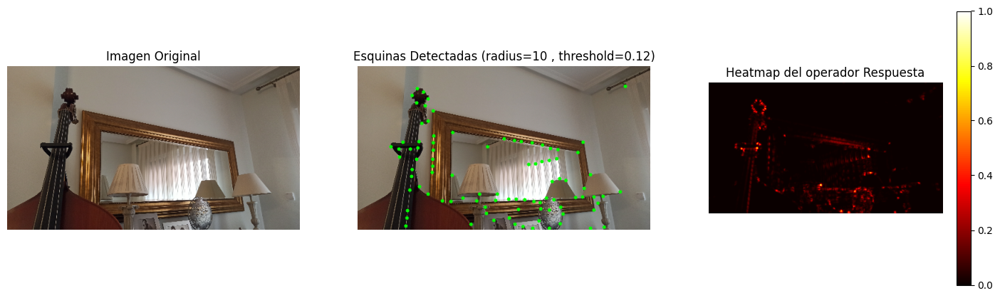

In [36]:
my_image = cv2.imread('CVFiles2/salon.jpg')
b,g,r = cv2.split(my_image)           # guardamos b, g, r
my_image = cv2.merge([r,g,b])         # cambiamos a r, g, b

corners = custom_Harris(my_image, radius=10, threshold=0.12)

Vemos que no se consiguen buenos resultados ajustando ``threshold=0.12,0.2,0.3,0.5`` esto se debe a las malas condiciones de iluminación que presenta la foto, haciendo uy dificil la aparición de buenos gradientes al convertirla en escala de gris, y por tanto, afectando a los valores propios que intervienen en el operador respuesta.

## <div style="background-color: #54c7ec; color: #fff; font-weight: 700; padding-left: 10px; padding-top: 5px; padding-bottom: 5px"><strong>Ejercicio OP3G (0.2 pts)</strong></div>

Ídem a OP3E, pero para el método FAST.

### **Planteamiento del ejercicio**

EL algoritmo de método FAST que vamos a implementar como función, actúa secuancialmente de la siguiente forma:

0. (Opcional con resize=True) - Resizing de la imagen para que tenga un tamaño contenido y poder hacer pruebas de concepto con mayor fluidez
1. Convertir la imagen a escala de gris
2. Detección de esquinas con círculo de Bresenham y distinción en esquinas positivas o negativas

* Extra: Al poner ``showAll=True`` también se muestran por pantalla 2 imágenes: la original y una superposición de las esquinas (positivas y negativas) sobre la imagen original.



### **Resolución**

In [37]:
def custom_FAST(image, threshold=30, resize=True, showAll=True):
    """
    Método FAST simplificado con distinción de esquinas positivas y negativas.

    Parámetros:
    - image: Imagen de entrada (BGR o escala de grises).
    - threshold: Umbral para la detección de esquinas [0,255].
    - resize: Booleano para redimensionar la imagen.
    - showAll: Booleano para mostrar imágenes de entrada y salida.

    Retorna:
    - Diccionario con listas de esquinas positivas y negativas: {'positive': [...], 'negative': [...]}
    """
    # Paso 0: Redimensionar la imagen
    if resize:
        height, width = image.shape[:2]
        scale = min(512 / max(height, width), 1.0)
        image = cv2.resize(image, (int(width * scale), int(height * scale)))

    # Paso 1: Convertir a escala de grises
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY) if len(image.shape) == 3 else image


    # Paso 2: Detección de esquinas con círculo de Bresenham (escaneo optimizado) y distinción en esquinas positivas o negativas
    offsets = [
        (-3, 0), (3, 0), (0, -3), (0, 3),  # N, S, W, E
        (-3, 1), (-3, -1), (3, 1), (3, -1),
        (-2, 2), (-2, -2), (2, 2), (2, -2),
        (-1, 3), (-1, -3), (1, 3), (1, -3)
    ]

    positive_corners = []  # Esquinas positivas
    negative_corners = []  # Esquinas negativas

    for y in range(3, gray.shape[0] - 3):       # Recorremos la imagen en grises de acuerdo con el tamño del círculo de Bresenham
        for x in range(3, gray.shape[1] - 3):
            center_value = gray[y, x]           # En cada iteración fijamos un centro

            # Escaneo inicial (N, S, W, E) para descartar eficazmente casos claros de no-esquina
            nswe_values = [gray[y + dy, x + dx] for dy, dx in offsets[:4]]
            if sum(1 for val in nswe_values if val > center_value + threshold) < 3 and \
               sum(1 for val in nswe_values if val < center_value - threshold) < 3:
                continue

            # Revisar ahora todos los píxeles en el círculo con el criterio de sumar 12 pixeles de 16 "activos" en el circulo de Bresenham escogido
            brighter, darker = 0, 0
            for dy, dx in offsets:
                neighbor_value = gray[y + dy, x + dx]
                if neighbor_value > center_value + threshold:       # Aquí notamos la importancia de la elección del threshold
                    brighter += 1
                elif neighbor_value < center_value - threshold:
                    darker += 1

            # Clasificar el punto como esquina positiva o negativa
            if brighter >= 12:
                positive_corners.append((y, x))
            elif darker >= 12:
                negative_corners.append((y, x))

    # Paso 3: Visualizar resultados
    if showAll:
        plt.figure(figsize=(10, 5))

        # Imagen original
        plt.subplot(1, 2, 1)
        plt.imshow(image, cmap="gray")
        plt.title("Imagen original")
        plt.axis("off")

        # Imagen con esquinas
        result_image = image.copy()
        for y, x in positive_corners:
            cv2.circle(result_image, (x, y), 3, (0, 255, 0), -1)  # Verde para positivas
        for y, x in negative_corners:
            cv2.circle(result_image, (x, y), 3, (255, 0, 0), -1)  # Rojo para negativas

        plt.subplot(1, 2, 2)
        plt.imshow(result_image)
        plt.title("Esquinas detectadas (Rojo : negativas , Verde : positivas)")
        plt.axis("off")

        plt.tight_layout()
        plt.show()

    return {'positive': positive_corners, 'negative': negative_corners}


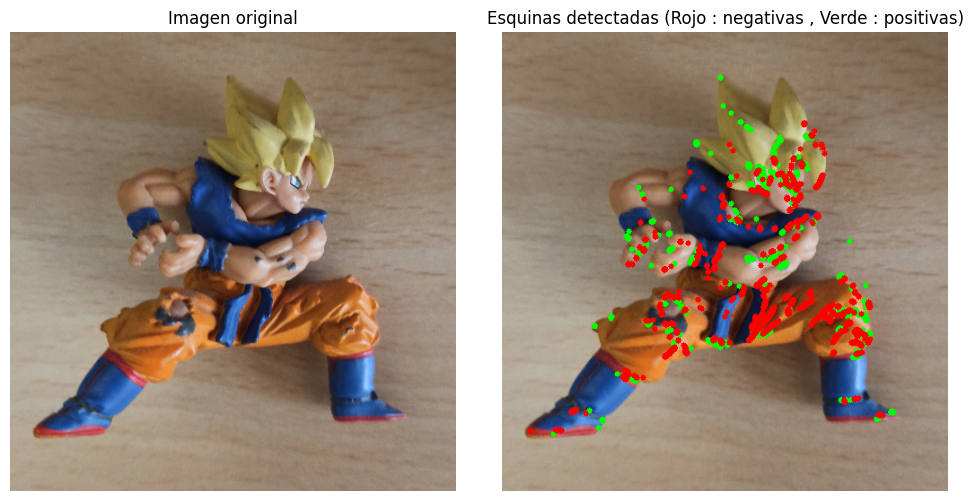

In [38]:
my_image = cv2.imread('CVFiles2/goku2.jpg')
b,g,r = cv2.split(my_image)           # guardamos b, g, r
my_image = cv2.merge([r,g,b])         # cambiamos a r, g, b

corners_dict = custom_FAST(my_image, threshold=15, resize=True, showAll=True)

### ``Comentarios:``
La cantidad de esquinas detectada con bajos umbrales es algo más basta que con el detector de Harris, pero esto seguramente se deba a que la implementación de FAST no incorpora la supresión de no máximos por radio, como si lleva la implementación de Harris. Lo bueno de este método es que distingue esquinas positivas y negativas en función del signo del gradiente alrededor de la esquina en cuestión.

Otra pega que vemos es que parece que detecta más bordes (que no son esquina) de forma indebida, comparándolo con Harris.

### ``Pruebas adicionales:``

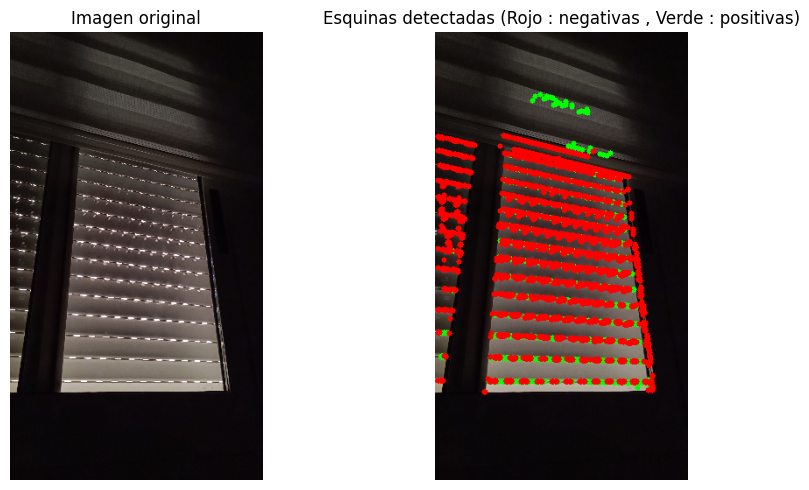

In [39]:
my_image = cv2.imread('CVFiles2/ventana.jpg')
b,g,r = cv2.split(my_image)           # guardamos b, g, r
my_image = cv2.merge([r,g,b])         # cambiamos a r, g, b

corners_dict = custom_FAST(my_image, threshold=25, resize=True, showAll=True)

Aquí hemos podido subir el umbral debido a las condicinoes de iluminación de la imgen, que han sido creadas a propósito para esta prueba. ASí conseguimos detectar muchas de las "esquinas" y con bastante limpieza, incluso con un umbral más alto que en el caso anterior. Podemos ver que en este cao se solapan un poco los puntos rojos y verdes de las esquinas, precisamente por no haber puesto supresión de máximos por radio. Esto permite detectar múltiples esquinas eficazmente en imágenes con muchos segmentos cortos de diferente iluminación (como es el caso). Hemos escogido esta implementación para tener una alternativa a la de Harris que sí incorporaba supresión por radio, ya que para algún caso si que puede interesar evitar esa supresión (imaginemos por ejemplo imágenes al microscopio que se toman en ciertas condiciones de iluminación muy controlada y en las que interesa hacer un conteo de puntos o células usando esta técnica).

Para poder distinguir mejor las esquinas positivas de las negativas en esta imagen deberíamos reducir el tamaño de los puntos que las ubican sobre la imagen en el plot.

## <div style="background-color: #54c7ec; color: #fff; font-weight: 700; padding-left: 10px; padding-top: 5px; padding-bottom: 5px"><strong>Ejercicio OP3H (0.3 pts)</strong></div>

Ídem a OP3E, pero para cualesquiera de (o todos) los operadores de detección de blobs
LoG/DoG/DoH.

**¡ Cuidado al ejecutar este ejercicio, tarda bastante en ejecutarse completamente !**

In [40]:
from skimage.feature import peak_local_max
from skimage.filters import gaussian

def custom_blob_detector(image, method='DoG', scales=None):
    # Convertir imagen a escala de grises
    img = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY) if len(image.shape) == 3 else img

    if scales is None:
        scales = [1.0, 2.0, 3.0, 4.0]  # Escalas por defecto si no se especifican

    blobs = []
    if method == 'DoG':
        # Método de Diferencia de Gausianas (DoG) con localización en espacio de escalas
        for sigma in scales:
            # Aplicar filtro gaussiano con diferentes sigmas
            img_gaussian1 = gaussian(img, sigma=sigma)
            img_gaussian2 = gaussian(img, sigma=sigma * 1.5)

            # Calcular la diferencia entre las imágenes gaussianas
            diff_of_gaussians = img_gaussian1 - img_gaussian2

            # Detectar los puntos máximos locales en el espacio de escalas
            blobs_local_max = peak_local_max(diff_of_gaussians, min_distance=5)
            blobs.append(blobs_local_max)

    elif method == 'LoG':
        # Método de Laplaciano de Gausianas (LoG) con localización en espacio de escalas
        for sigma in scales:
            # Aplicar filtro gaussiano y luego el laplaciano
            img_gaussian = gaussian(img, sigma=sigma)
            img_laplacian = cv2.Laplacian(img_gaussian, cv2.CV_64F)

            # Detectar los puntos máximos locales en el espacio de escalas
            blobs_local_max = peak_local_max(img_laplacian, min_distance=5)
            blobs.append(blobs_local_max)

    elif method == 'DoH':
        # Método de Determinante del Hessiano (DoH) con localización en espacio de escalas
        for sigma in scales:
            # Aplicar filtro gaussiano
            img_gaussian = gaussian(img, sigma=sigma)

            # Derivadas de la imagen
            grad_x = cv2.Sobel(img_gaussian, cv2.CV_64F, 1, 0, ksize=3)
            grad_y = cv2.Sobel(img_gaussian, cv2.CV_64F, 0, 1, ksize=3)

            # Calcular el Hessiano (segundas derivadas)
            grad_xx = cv2.Sobel(grad_x, cv2.CV_64F, 1, 0, ksize=3)
            grad_yy = cv2.Sobel(grad_y, cv2.CV_64F, 0, 1, ksize=3)
            grad_xy = cv2.Sobel(grad_x, cv2.CV_64F, 0, 1, ksize=3)

            # Determinante del Hessiano
            hessian_det = grad_xx * grad_yy - grad_xy**2

            # Detectar los puntos máximos locales en el espacio de escalas
            blobs_local_max = peak_local_max(hessian_det, min_distance=5)
            blobs.append(blobs_local_max)

    else:
        print("ERROR: please select a method for blob detection to use")
        return

    # Visualizar los blobs detectados sobre la imagen original
    img_with_blobs = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)  # Convertir a color para visualizar los blobs
    for scale_blobs in blobs:
        for blob in scale_blobs:
            cv2.circle(img_with_blobs, (blob[1], blob[0]), 5, (0, 0, 255), -1)

    # Mostrar la imagen con los blobs detectados
    plt.imshow(img_with_blobs)
    plt.title(f"Blob Detection using {method} in Scale Space")
    plt.axis('off')
    plt.show()


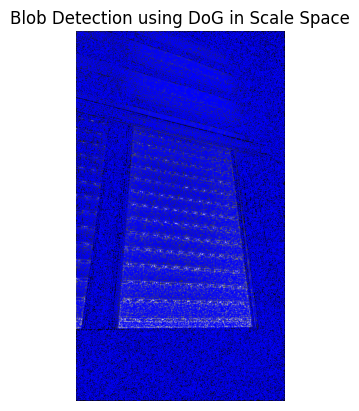

In [41]:
my_image = cv2.imread('CVFiles2/ventana.jpg')
b,g,r = cv2.split(my_image)           # guardamos b, g, r
my_image = cv2.merge([r,g,b])         # cambiamos a r, g, b

custom_blob_detector(my_image, method='DoG')

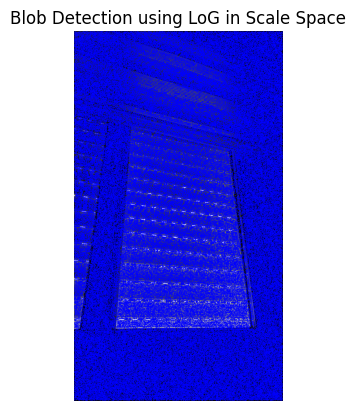

In [42]:
custom_blob_detector(my_image, method='LoG')

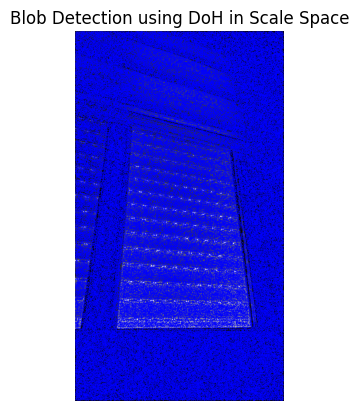

In [43]:
custom_blob_detector(my_image, method='DoH')

El método que más me convence sobre esta prueba es ``method='DoH'`` pues deja ver bastante bien los pequeños blobs y opaca mejor el fondo en azul. Vamos a hacer mas pruebas con otras fotos.

### ``Pruebas adicionales:``

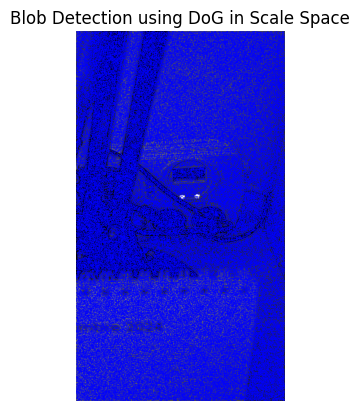

In [44]:
my_image = cv2.imread('CVFiles2/enchufes.jpg')
b,g,r = cv2.split(my_image)           # guardamos b, g, r
my_image = cv2.merge([r,g,b])         # cambiamos a r, g, b

custom_blob_detector(my_image, method='DoG')

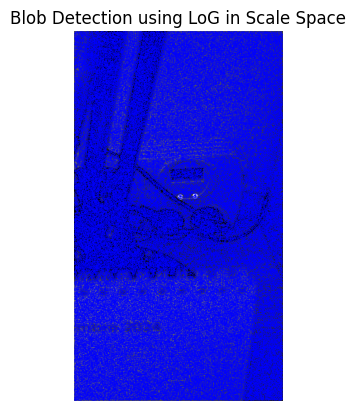

In [45]:
custom_blob_detector(my_image, method='LoG')

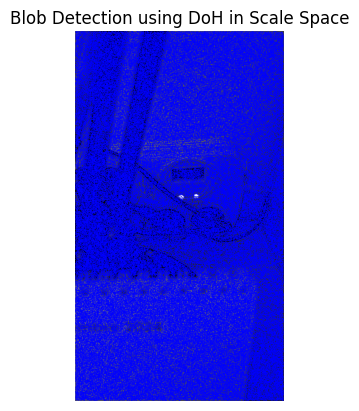

In [46]:
custom_blob_detector(my_image, method='DoH')

Con cualquiera de los tres métodos se detectan bien los blobs (esta vez mas grandes) del interruptor del enchufe. Aunque los que mejor funcionan son DoG y DoH.

Realizamos una última prueba

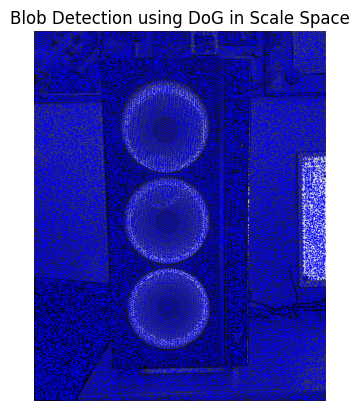

In [47]:
my_image = cv2.imread('CVFiles2/PCfrontal.jpg')
b,g,r = cv2.split(my_image)           # guardamos b, g, r
my_image = cv2.merge([r,g,b])         # cambiamos a r, g, b

custom_blob_detector(my_image, method='DoG', scales=[2,5,10,20])

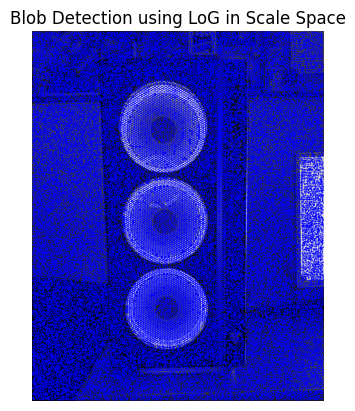

In [48]:
custom_blob_detector(my_image, method='LoG', scales=[2,5,10,20])

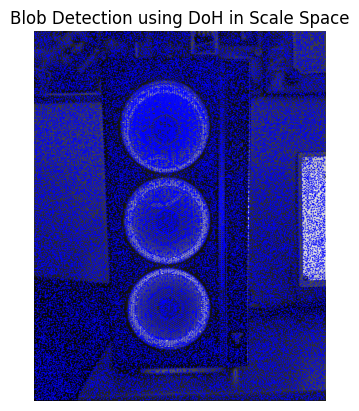

In [49]:
custom_blob_detector(my_image, method='DoH', scales=[5,10,20,30,40])

En este caso todos funcionan mal porque el tamaño del blob de los ventiladores del ordenador es bastante grande en proporcion al resto de la imagen, pero podemos ver cómo es más o menos distinguible como blob al emplear LoG con la selección de octavas adecuada

## <div style="background-color: #54c7ec; color: #fff; font-weight: 700; padding-left: 10px; padding-top: 5px; padding-bottom: 5px"><strong>Ejercicio OP3J (Hasta 1.0 pts)</strong></div>

Implementar (documentando e ilustrando bien cada paso implementado en el correspondiente notebook), a nivel de prueba de concepto, alguna/varias etapas del extractor de características SIFT: desde la detección inicial de máximos de la DoG en el espacio multiescala del detector SIFT, pasando por la posible detección de máximos con precisión subpíxel posterior, y la eliminación de máximos sin suficiente estructura (problema de apertura), hasta la posterior caracterización de la orientación y, por último, la extracción de los correspondientes vectores descriptores basados en la estructura de los gradientes locales.

**¡Cuidado, tarda 5 minutos en ejecutar en colab todo el ejercicio!**

Para comenzar, escogemos las imágenes a las que aplicaremos el extractor de características SIFT.

In [50]:
image_revista = cv2.cvtColor(cv2.imread('CVFiles2/revista.jpg'), cv2.COLOR_BGR2RGB)
image_mueble = cv2.cvtColor(cv2.imread('CVFiles2/mueble.jpg'), cv2.COLOR_BGR2RGB)

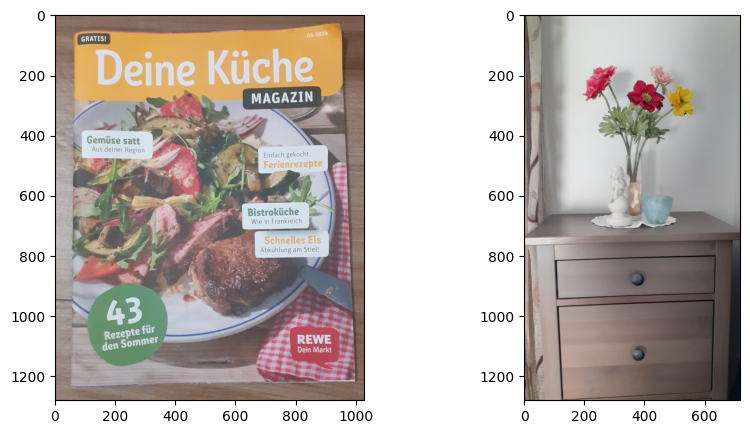

In [51]:
imshow_all(image_revista, image_mueble)

#### Paso 1: Detección inicial de puntos clave

El extractor de características SIFT necesita en primer lugar de los extremos de la DoG a distintas escalas. Por ello, iniciamos creando una función `generate_gaussian_and_DoG`, cuyo propósito principal es generar una serie de imágenes con filtros gaussianos y sus respectivas diferencias de Gaussianas (DoG) a distintas escalas y octavas. Esto será crucial para la localización de puntos clave en una imagen, que luego se refinarán y se usarán en el proceso de extracción de características. Este proceso que lleva a cabo la función consiste en lo siguiente:

1. Se especifica el número de octavas, cada una de las cuales consiste en un conjunto de imágenes generadas mediante submuestreo de la imagen original. En cada submuestreo, la resolución de la imagen se reduce a la mitad de la resolución original, o de la resolución de la anterior octava, según corresponda.

2. En cada octava, se realizan $s+3$ suavizados gaussianos, siendo $s$ el número de escalas. Partiendo de un $\sigma_0$ inicial para el primer suavizado, los sucesivos suavizados dentro de una misma octava se calculan con $\sigma_i = 2^{i/s}\cdot\sigma_0$, para $i=1,\dots, s+2$. Para iniciar las siguientes octavas, se toma un submuestreo (píxel sí, píxel no) de la antepenúltima imagen de la octava actual, reduciendo así su resolución a la mitad.

3. Las imágenes generadas en cada octava se restan por parejas de forma secuencial, obteniendo así las diferencias de Gaussianas (DoG).

In [52]:
def generate_gaussian_and_DoG(image, num_octaves=4, num_scales=2, initial_sigma=1.6):
    gaussian_images = []  # Lista para almacenar las imágenes Gaussianas
    DoG_images = []       # Lista para almacenar las DoG
    sigma_values = []     # Lista para almacenar los valores de sigma

    # Preprocesamiento: convertir a escala de grises
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY) if len(image.shape) == 3 else image
    initial_image = gray_image.astype('float32') / 255.0  # Normalizar

    for octave in range(num_octaves):
        # Crear listas para imágenes Gaussianas y DoG de esta octava
        octave_gaussian = []
        octave_DoG = []
        octave_sigma = []  # Lista para los valores de sigma de esta octava

        # Generar imágenes Gaussianas en esta octava
        sigma = initial_sigma
        k = 2 ** (1 / num_scales)
        for i in range(num_scales + 3):  # Necesitamos s+3 suavizados gaussianos para s escalas
            blurred = filters.gaussian(initial_image, sigma=sigma)
            octave_gaussian.append(blurred)
            octave_sigma.append(sigma)
            if i < num_scales + 2:
                sigma *= k

        # Calcular las DoG para esta octava
        for i in range(len(octave_gaussian) - 1):
            dog = octave_gaussian[i + 1] - octave_gaussian[i]
            octave_DoG.append(dog)

        gaussian_images.append(octave_gaussian)
        DoG_images.append(octave_DoG)
        sigma_values.append(octave_sigma)

        # Submuestrear la antepenúltima imagen para empezar con ella en la siguiente octava
        if octave < num_octaves - 1:    # Para no submuestrear después de la última octava
            initial_image = octave_gaussian[-3][::2, ::2]
            initial_sigma = octave_sigma[-3]

    return gaussian_images, DoG_images, sigma_values

A continuación, se prueba la función con las imágenes escogidas, y después se muestran las imágenes DoG resultantes para las distintas octavas y escalas:

In [53]:
gaussian_images_revista, DoG_images_revista, sigma_values_revista = generate_gaussian_and_DoG(image_revista, num_octaves=4, num_scales=2, initial_sigma=1.6)
gaussian_images_mueble, DoG_images_mueble, sigma_values_mueble = generate_gaussian_and_DoG(image_mueble, num_octaves=4, num_scales=2, initial_sigma=1.6)

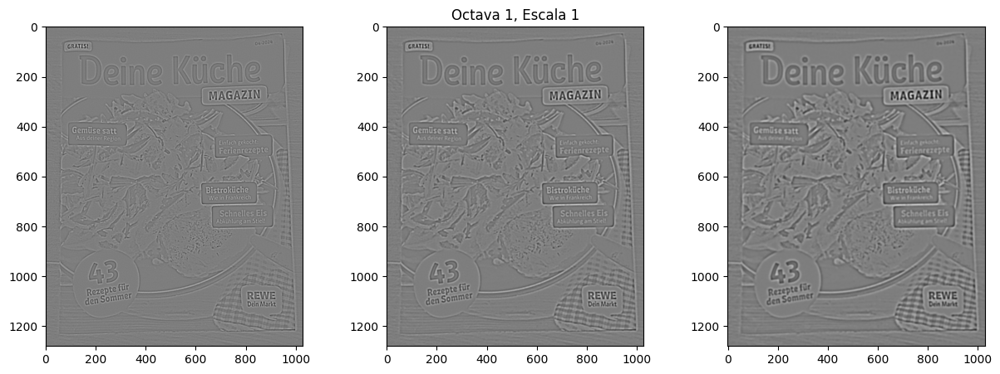

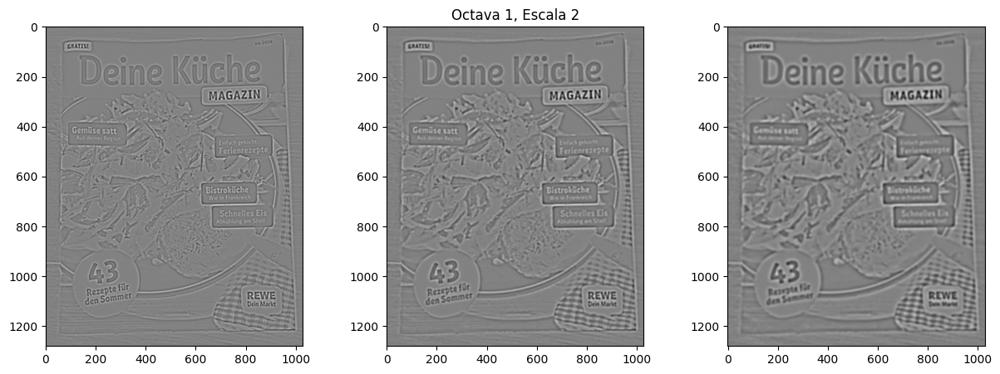

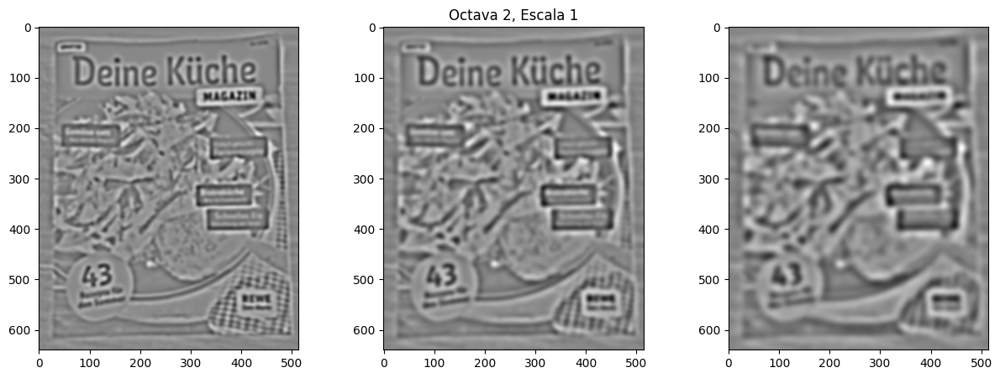

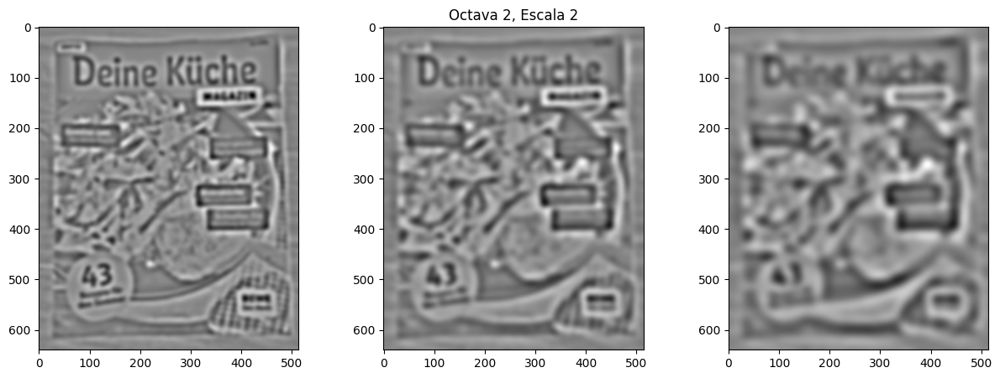

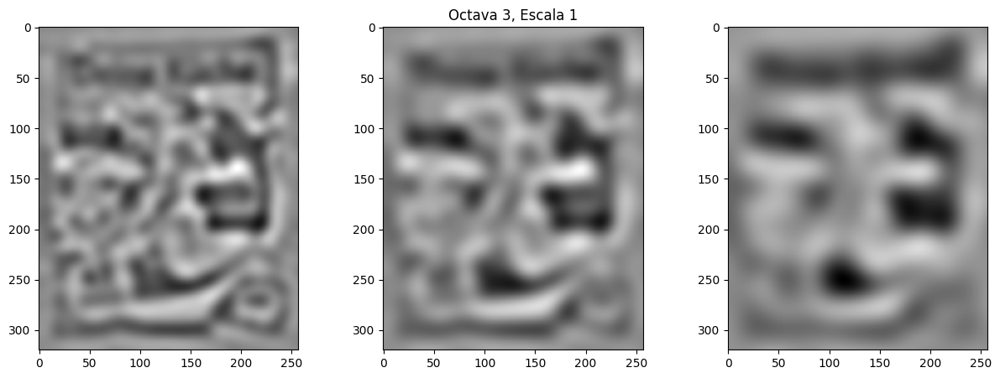

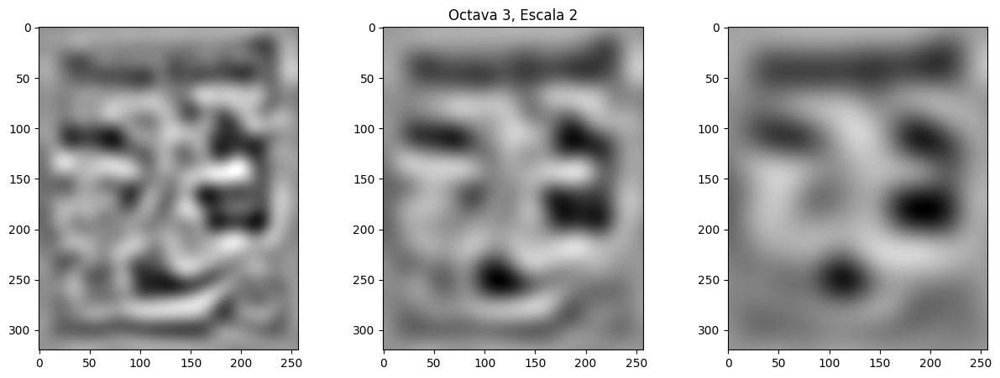

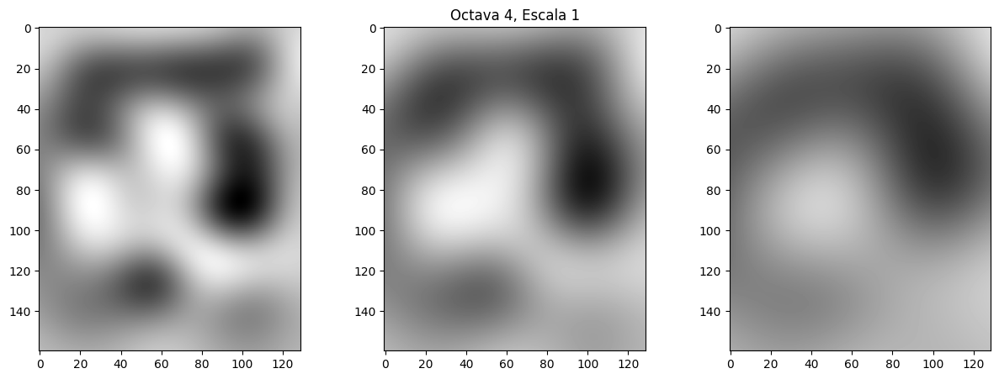

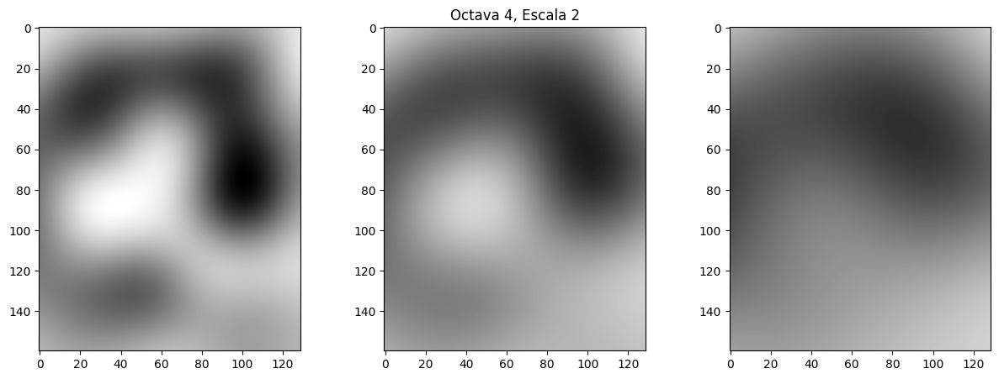

In [54]:
# Visualizar las imágenes DoG
for octave_idx, octave_DoG in enumerate(DoG_images_revista):

    # Iterar sobre las escalas (grupos de 3 DoG consecutivas)
    for scale_idx in range(1, len(octave_DoG) - 1):
        # Seleccionar las DoG correspondientes al grupo actual
        prev_image = octave_DoG[scale_idx - 1]
        current_image = octave_DoG[scale_idx]
        next_image = octave_DoG[scale_idx + 1]

        # Mostrar los DoG en este grupo de 3
        imshow_all(prev_image, current_image, next_image, titles=[None, f'Octava {octave_idx+1}, Escala {scale_idx}', None])

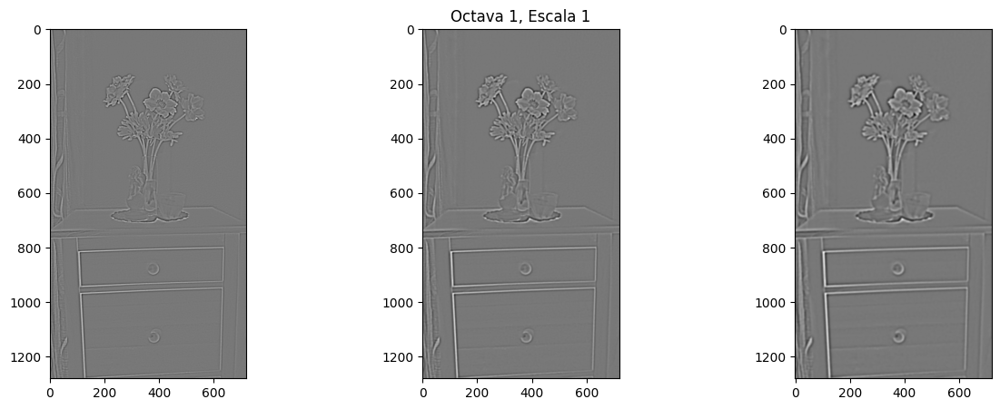

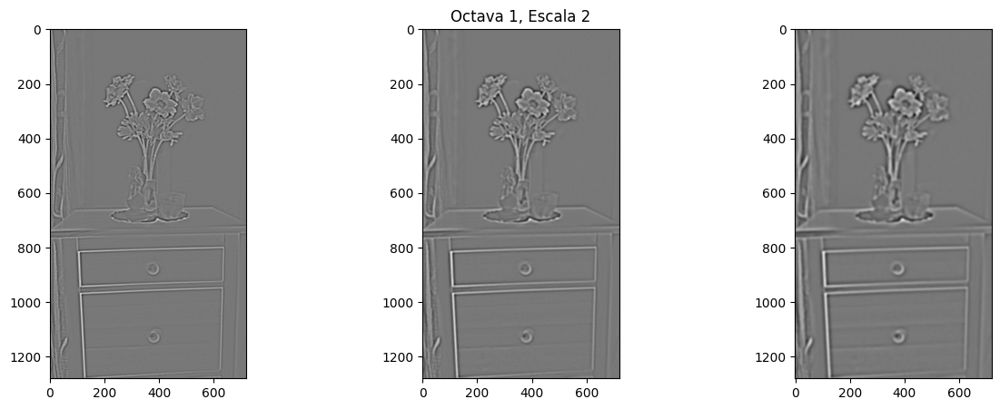

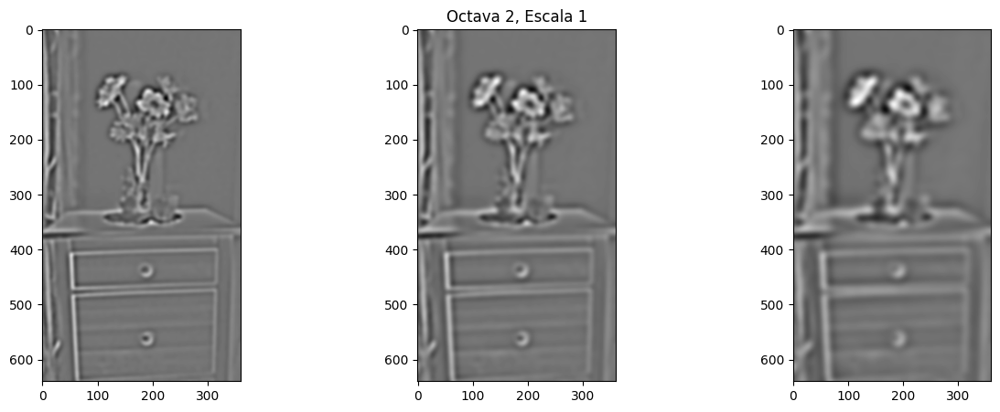

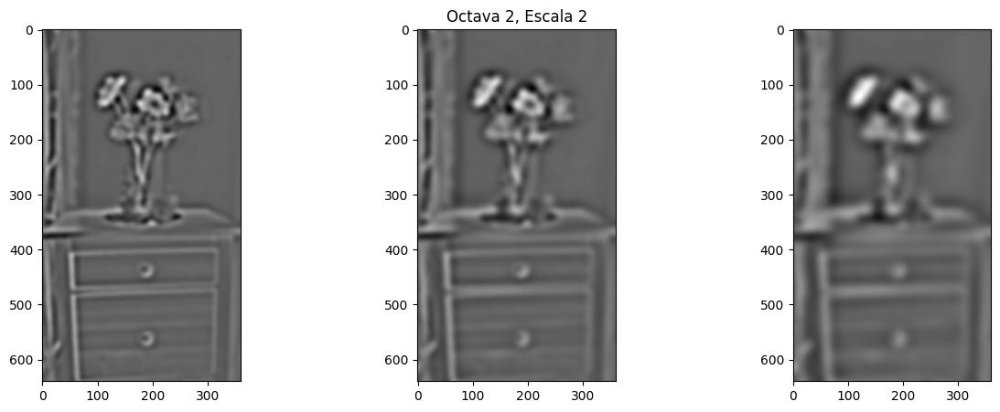

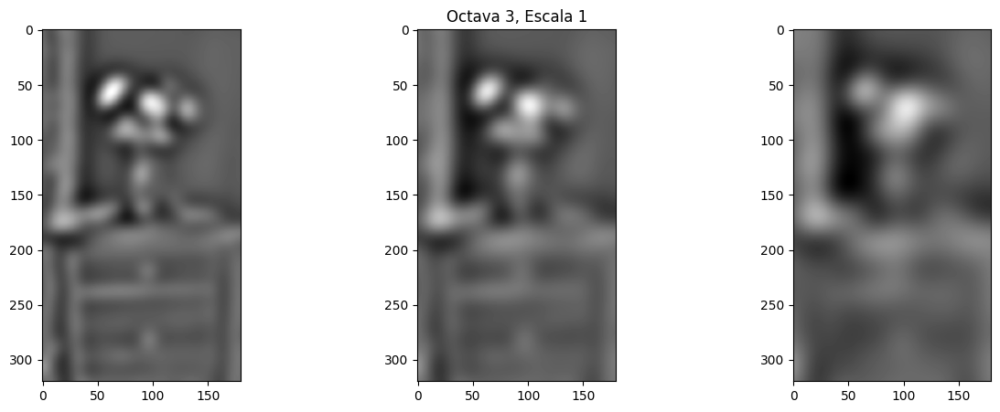

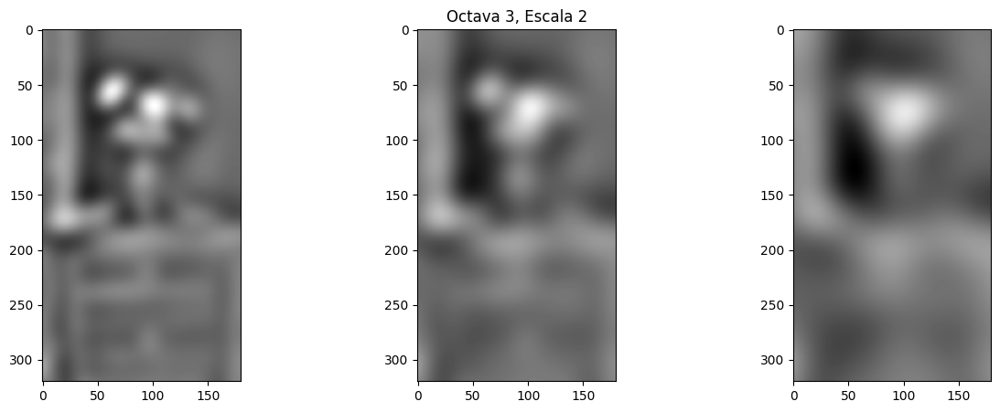

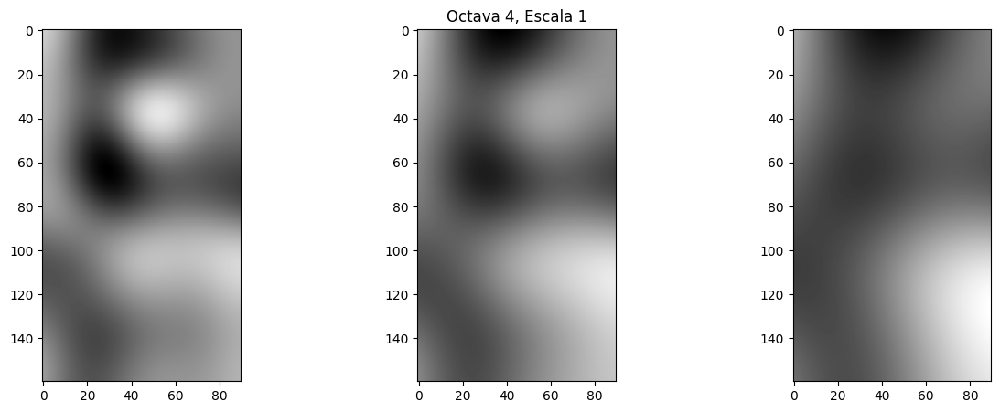

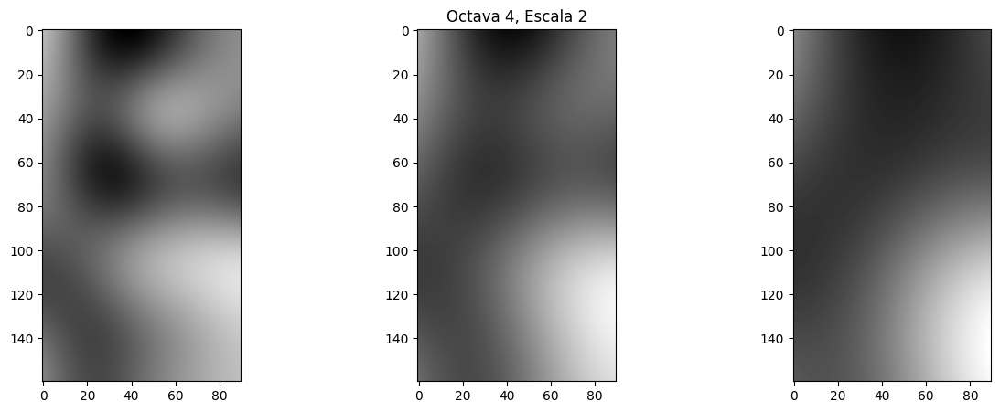

In [55]:
# Visualizar las imágenes DoG
for octave_idx, octave_DoG in enumerate(DoG_images_mueble):

    # Iterar sobre las escalas (grupos de 3 DoG consecutivas)
    for scale_idx in range(1, len(octave_DoG) - 1):
        # Seleccionar las DoG correspondientes al grupo actual
        prev_image = octave_DoG[scale_idx - 1]
        current_image = octave_DoG[scale_idx]
        next_image = octave_DoG[scale_idx + 1]

        # Mostrar los DoG en este grupo de 3
        imshow_all(prev_image, current_image, next_image, titles=[None, f'Octava {octave_idx+1}, Escala {scale_idx}', None])

A continuación, la función `detect_max_min` se encarga de la detección de los puntos clave. Para ello, va recorriendo cada octava, y para cada una, extrae las escalas correspondientes. Cada escala está formada por un grupo de $3$ DoG consecutivas. Para cada una, se recorre la imagen central del grupo tomando cada píxel como un posible candidato a punto clave. Para determinar si un píxel es un extremo local, se compara su valor con los valores de su vecindario tridimensional de $3 \times 3 \times 3$, que incluye los píxeles vecinos en la misma imagen, así como los de las imágenes anterior y posterior en la escala. Si el valor del píxel es estrictamente mayor o menor que todos los valores de su vecindario, se marca como un extremo local y se almacena como punto clave.

In [56]:
def detect_max_min(DoG_images, sigma_values):
    keypoints = []  # Lista para almacenar los puntos clave detectados

    for octave_idx, octave_DoG in enumerate(DoG_images):

        # Iterar sobre las escalas (grupos de 3 DoG consecutivas)
        for scale_idx in range(1, len(octave_DoG) - 1):
            # Seleccionar las DoG correspondientes al grupo actual
            prev_image = octave_DoG[scale_idx - 1]
            current_image = octave_DoG[scale_idx]
            next_image = octave_DoG[scale_idx + 1]

            # Calcular el valor de sigma correspondiente a la current_image
            sigma_current = sigma_values[octave_idx][scale_idx]

            # Recorremos los píxeles de la imagen central del grupo
            rows, cols = current_image.shape
            for row in range(1, rows - 1):  # Evitamos bordes
                for col in range(1, cols - 1):
                    pixel_val = current_image[row, col]

                    # Vecindad 3D (prev_image, current_image, next_image)
                    neighbors = np.concatenate((
                        prev_image[row-1:row+2, col-1:col+2].ravel(),
                        current_image[row-1:row+2, col-1:col+2].ravel(),
                        next_image[row-1:row+2, col-1:col+2].ravel()
                    ))
                    neighbors = neighbors[neighbors != pixel_val]  # Eliminar el valor central

                    # Verificar si es máximo o mínimo local
                    if (pixel_val > np.max(neighbors) or pixel_val < np.min(neighbors)):
                        keypoints.append((row, col, sigma_current))  # Usamos el sigma correspondiente

    return keypoints

Calculamos los puntos clave para las imágenes seleccionadas, y los mostramos sobre las imágenes originales:

In [57]:
keypoints_revista = detect_max_min(DoG_images_revista, sigma_values_revista)

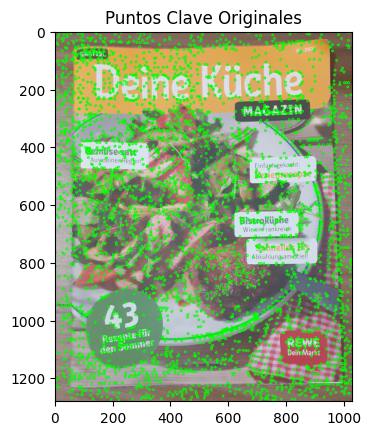

In [58]:
image_revista_copy = image_revista.copy()

# Dibujar los puntos clave
for (row, col, sigma) in keypoints_revista:
    # Dibujar el punto clave en la imagen
    cv2.circle(image_revista_copy, (col, row), radius=3, color=(0, 255, 0), thickness=2)

# Mostrar la imagen con los puntos clave
plt.imshow(image_revista_copy, cmap='gray')
plt.title("Puntos Clave Originales")
plt.show()

In [59]:
keypoints_mueble = detect_max_min(DoG_images_mueble, sigma_values_mueble)

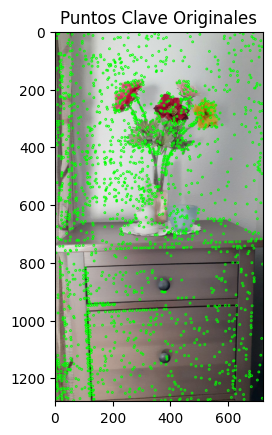

In [60]:
image_mueble_copy = image_mueble.copy()

# Dibujar los puntos clave
for (row, col, sigma) in keypoints_mueble:
    # Dibujar el punto clave en la imagen
    cv2.circle(image_mueble_copy, (col, row), radius=3, color=(0, 255, 0), thickness=2)

# Mostrar la imagen con los puntos clave
plt.imshow(image_mueble_copy, cmap='gray')
plt.title("Puntos Clave Originales")
plt.show()

#### Paso 2: Detección de extremos con precisión subpíxel

El siguiente paso en el método SIFT consiste en obtener la posición exacta de cada máximo o mínimo con precisión subpíxel. Para llevar esto a cabo, primero vamos a necesitar algunas funciones auxiliares. En primer lugar, la función `get_octave_scale_from_keypoint` busca el índice de la octava y el de la escala correspondientes a un punto clave, dado el $\sigma$ correspondiente a la imagen central de la escala.

In [61]:
def get_octave_scale_from_keypoint(sigma_current, DoG_images, sigma_values):
    # Buscar en qué octava y escala se encuentra el keypoint
    for octave_idx, octave_DoG in enumerate(DoG_images):
        for scale_idx in range(1, len(octave_DoG) - 1):
            # Comprobación para encontrar el keypoint
            if sigma_current == sigma_values[octave_idx][scale_idx]:
                return octave_idx, scale_idx

Además, definimos una función `calculate_gradient`, que tiene como objetivo calcular el gradiente en un punto específico de la pirámide de DoG. Este gradiente se calcula en $3$ dimensiones: dos correspondientes al espacio $(x,y)$ y una correspondiente a la escala $(\sigma)$. La función toma como entrada las imágenes actual, anterior y posterior en términos de escala, junto con las coordenadas espaciales del píxel de interés $(row, col)$.

In [62]:
def calculate_gradient(current_image, prev_image, next_image, row, col):
    """ Calcular el gradiente en 3D (espacio y escala) """

    # Derivadas en la dirección x e y
    dx = (current_image[row, col + 1] - current_image[row, col - 1]) / 2
    dy = (current_image[row + 1, col] - current_image[row - 1, col]) / 2

    # Derivada en la dirección sigma
    dsigma = (next_image[row, col] - prev_image[row, col]) / 2

    return np.array([dx, dy, dsigma])

Definimos también una función `calculate_hessian` para calcular la matriz Hessiana en $3$ dimensiones para un punto específico $(x,y,\sigma)$ de la pirámide de DoG.

In [63]:
def calculate_hessian(current_image, prev_image, next_image, row, col):
    """ Calcular la matriz Hessiana en 3D (espacio y escala) """

    # Segundas derivadas puras
    dxx = current_image[row, col + 1] - 2 * current_image[row, col] + current_image[row, col - 1]
    dyy = current_image[row + 1, col] - 2 * current_image[row, col] + current_image[row - 1, col]
    dsigma2 = next_image[row, col] - 2 * current_image[row, col] + prev_image[row, col]

    # Segundas derivadas cruzadas
    dxdy = (current_image[row + 1, col + 1] - current_image[row + 1, col - 1] -
            current_image[row - 1, col + 1] + current_image[row - 1, col - 1]) / 4

    dxdsigma = (next_image[row, col + 1] - next_image[row, col - 1] -
                prev_image[row, col + 1] + prev_image[row, col - 1]) / 4

    dydsigma = (next_image[row + 1, col] - next_image[row - 1, col] -
                prev_image[row + 1, col] + prev_image[row - 1, col]) / 4

    # Construir el Hessiano
    hessian = np.array([[dxx, dxdy, dxdsigma],
                        [dxdy, dyy, dydsigma],
                        [dxdsigma, dydsigma, dsigma2]])

    return hessian

A continuación, la función `interpolate_max_min` refina la localización de un punto clave detectado inicialmente, calculando su posición exacta con posición exacta. Esto se logra a partir de la expansión de Taylor en $3$ dimensiones. Para ello, se calcula en dicho punto la siguiente expresión:

$$ \hat x = - \frac{\partial^2 D}{\partial x^2}^{-1} \cdot \frac{\partial D}{\partial x}$$

In [64]:
def interpolate_max_min(current_image, prev_image, next_image, row, col, sigma_current):
    """
    Refinar la localización del punto clave usando la expansión de Taylor 3D.
    """
    # Vector de derivadas de primer orden (gradiente)
    gradient = calculate_gradient(current_image, prev_image, next_image, row, col)

    # Matriz Hessiana (segunda derivada)
    hessian = calculate_hessian(current_image, prev_image, next_image, row, col)

    # Resolver la ecuación para ajustar la posición
    adjustment = -np.linalg.inv(hessian).dot(gradient)

    # Coordenadas con precisión subpíxel
    adjusted_row = row + adjustment[0]
    adjusted_col = col + adjustment[1]
    adjusted_sigma = sigma_current + adjustment[2]

    # Asegurarse de que las coordenadas estén dentro de los límites de la imagen
    adjusted_row = np.clip(adjusted_row, 0, current_image.shape[0] - 1)
    adjusted_col = np.clip(adjusted_col, 0, current_image.shape[1] - 1)

    # Asegurarse de que el sigma ajustado sea positivo (necesario para aplicar el suavizado gaussiano)
    adjusted_sigma = max(adjusted_sigma, 0.01)

    return adjusted_row, adjusted_col, adjusted_sigma

Habiendo definido las funciones anteriores, la siguiente función, `subpixel_estimation`, finalmente obtiene una estimación precisa de la localización de todos los puntos clave encontrados anteriormente, computando la posición exacta del punto con precisión subpíxel.

In [65]:
def subpixel_estimation(keypoints, DoG_images, sigma_values):
    subpixel_keypoints = {}  # Diccionario para almacenar los puntos refinados

    # Iterar sobre los puntos clave
    for (row, col, sigma_current) in keypoints:
        # Obtener los índices de la octava y de la escala correspondientes al punto
        octave_idx, scale_idx = get_octave_scale_from_keypoint(sigma_current, DoG_images, sigma_values)

        prev_image = DoG_images[octave_idx][scale_idx - 1]
        current_image = DoG_images[octave_idx][scale_idx]
        next_image = DoG_images[octave_idx][scale_idx + 1]

        # Aplicar la interpolación subpíxel para refinar la localización
        adjusted_row, adjusted_col, adjusted_sigma = interpolate_max_min(current_image, prev_image, next_image, row, col, sigma_current)

         # Almacenar el ajuste subpíxel como el valor asociado a la clave (row, col, sigma_current)
        subpixel_keypoints[(row, col, sigma_current)] = (adjusted_row, adjusted_col, adjusted_sigma)

    return subpixel_keypoints

A continuación, se estima la localización de los puntos clave encontradosa anteriormente con precisión subpíxel:

In [66]:
subpixel_keypoints_revista = subpixel_estimation(keypoints_revista, DoG_images_revista, sigma_values_revista)

In [67]:
subpixel_keypoints_mueble = subpixel_estimation(keypoints_mueble, DoG_images_mueble, sigma_values_mueble)

#### Paso 3: Eliminación de puntos inestables

El siguiente paso consiste en eliminar puntos que sean inestables, y para ello probamos a pasar dos filtros:

- Eliminar los puntos con un valor absoluto del máximo o el mínimo por debajo de un umbral $|D(x)| > 3\%$ del valor máximo de la imagen, donde:
$$ D(\hat x) = D + \frac{1}{2}\cdot\frac{\partial D}{\partial x}^T \cdot\hat x$$

- Eliminar los puntos en los que el ratio de valores propios del Hessiano $H$ esté por debajo de un umbral, donde:
$$ H =
\begin{pmatrix}
D_{xx} & D_{xy} \\
D_{xy} & D_{yy}
\end{pmatrix} $$

$$Tr(H) = D_{xx} + D_{yy} = \alpha + \beta$$

$$Det(H) = D_{xx}D_{yy} - D_{xy}^2 = \alpha\beta$$

$$ \frac{Tr(H)^2}{Det(H)} = \frac{(\alpha + \beta)^2}{\alpha\beta} = \frac{(r\beta + \beta)^2}{r\beta^2} = \frac{(r + 1)^2}{r}$$

Para ello, usamos la función `filter_keypoints`, que se define a continuación.

In [68]:
def filter_keypoints(keypoints, DoG_images, sigma_values, r=10):
    # Obtener los keypoints con precisión subpíxel
    subpixel_keypoints = subpixel_estimation(keypoints, DoG_images, sigma_values)

    stable_keypoints = {}  # Diccionario para almacenar puntos clave estables
    ratio_threshold = (r + 1) ** 2 / r  # Umbral del ratio de valores propios

    for (row, col, sigma_current) in keypoints:
        # Buscar en qué octava y escala se encuentra el keypoint
        octave_idx, scale_idx = get_octave_scale_from_keypoint(sigma_current, DoG_images, sigma_values)

        # Obtener la imagen previa, actual y siguiente
        prev_image = DoG_images[octave_idx][scale_idx - 1]
        current_image = DoG_images[octave_idx][scale_idx]
        next_image = DoG_images[octave_idx][scale_idx + 1]

        # Calcular D, gradiente y Hessiano en el punto original
        D = current_image[row, col]
        gradient = calculate_gradient(current_image, prev_image, next_image, row, col)
        hessian = calculate_hessian(current_image, prev_image, next_image, row, col)

        # Obtener la posición exacta del keypoint con precisión subpíxel
        adjusted_row, adjusted_col, adjusted_sigma = subpixel_keypoints[(row, col, sigma_current)]

        # Calcular D(x_hat)
        x_hat = np.array([adjusted_row, adjusted_col, adjusted_sigma])
        D_x_hat = D + (1/2) * np.dot(gradient, x_hat)

        # Obtener el valor máximo de la imagen actual
        max_value = np.max(current_image)

        # FILTRO 1: Eliminar puntos que no superen un umbral (3% del valor máximo de la imagen actual)
        contrast_threshold = 0.03 * max_value
        if abs(D_x_hat) < contrast_threshold:
            continue  # Descartar punto

        # Calcular la submatriz 2x2 del Hessiano, su traza y su determinante
        H_2x2 = hessian[:2, :2]
        trace_H = np.trace(H_2x2)
        det_H = np.linalg.det(H_2x2)

        # FILTRO 2: Eliminar puntos con ratio de valores propios del Hessiano por debajo de un umbral
        if det_H == 0 or (trace_H ** 2 / det_H) < ratio_threshold:
            continue  # Descartar punto

        # Si pasa ambos filtros, se mantiene como punto clave
        stable_keypoints[(row, col, sigma_current)] = (adjusted_row, adjusted_col, adjusted_sigma)

    return stable_keypoints

Ahora aplicamos esta función para las imágenes escogidas, para eliminar los puntos clave inestables. Lo puntos clave restantes se representan sobre las respectivas imágenes a continuación:

In [69]:
stable_keypoints_revista = filter_keypoints(keypoints_revista, DoG_images_revista, sigma_values_revista)

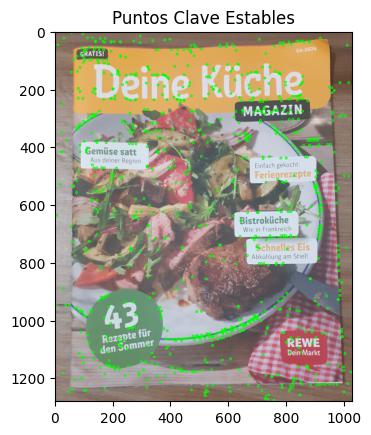

In [70]:
image_revista_copy = image_revista.copy()

# Dibujar los puntos clave
for (row, col, sigma) in stable_keypoints_revista.keys():
    # Dibujar el punto clave en la imagen
    cv2.circle(image_revista_copy, (col, row), radius=3, color=(0, 255, 0), thickness=2)

# Mostrar la imagen con los puntos clave
plt.imshow(image_revista_copy, cmap='gray')
plt.title("Puntos Clave Estables")
plt.show()

In [71]:
stable_keypoints_mueble = filter_keypoints(keypoints_mueble, DoG_images_mueble, sigma_values_mueble)

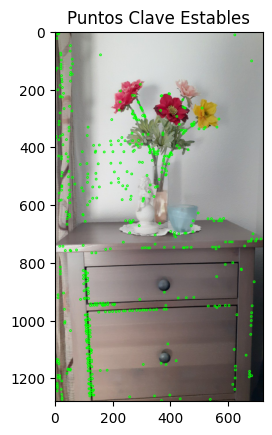

In [72]:
image_mueble_copy = image_mueble.copy()

# Dibujar los puntos clave
for (row, col, sigma) in stable_keypoints_mueble.keys():
    # Dibujar el punto clave en la imagen
    cv2.circle(image_mueble_copy, (col, row), radius=3, color=(0, 255, 0), thickness=2)

# Mostrar la imagen con los puntos clave
plt.imshow(image_mueble_copy, cmap='gray')
plt.title("Puntos Clave Estables")
plt.show()

#### Paso 4: Caracterización de la orientación

El siguiente paso en la implementación del extractor de características SIFT consiste en forzar la invarianza a la orientación. Para ello, en primer lugar deberemos calcular la magnitud $m$ y orientación $\theta$ del gradiente en cada punto. Estas se definen en cada punto $(x,y)$ como:

$$ m(x,y) = \sqrt{(L(x+1,y)-L(x-1,y))^2 + (L(x,y+1)-L(x,y-1))^2} $$

$$ \theta(x,y) = \tan^{-1} \left(\frac{L(x,y+1) - L(x,y-1)}{L(x+1,y) - L(x-1,y)}\right) $$

La siguiente función, `compute_magnitude_orientation`, calcula la magnitud y la orientación del gradiente en cada punto clave estable obtenido con precisión subpíxel:

In [73]:
def compute_magnitude_orientation(image, stable_keypoints, DoG_images, sigma_values):
    """
    Calcula la magnitud y la orientación del gradiente en un keypoint con precisión subpíxel,
    usando una imagen suavizada con el sigma correspondiente.

    Parámetros:
    - image: imagen original
    - stable_keypoints: diccionario con los puntos estables (row, col, sigma) con precisión subpíxel
    - DoG_images: lista con las DoG
    - sigma_values: lista con los valores de sigma

    Devuelve:
    - magnitudes: diccionario con la magnitud del gradiente en los keypoints
    - orientations: diccionario con la orientación del gradiente en los keypoints
    """

    magnitudes = {}
    orientations = {}

    # Convertir la imagen a escala de grises
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    for (row, col, sigma) in stable_keypoints.keys():
        # Obtener los índices de octava y escala para el punto
        octave_idx, scale_idx = get_octave_scale_from_keypoint(sigma, DoG_images, sigma_values)

        # Submuestrear la imagen según la octava a la que pertenezca
        subsampled_image = gray_image[::2**octave_idx, ::2**octave_idx]

        # Obtener el punto con precisión subpíxel correspondiente
        (subpixel_row, subpixel_col, subpixel_sigma) = stable_keypoints[(row, col, sigma)]

        # Suavizar la imagen con el sigma con precisión subpíxel correspondiente
        smoothed_image = filters.gaussian(subsampled_image, sigma=subpixel_sigma)

        # Para obtener el gradiente en x (dirección horizontal)
        coordinates_x = np.array([subpixel_row, subpixel_row])  # Coordenadas x fijas
        coordinates_y = np.array([subpixel_col - 1, subpixel_col + 1])  # Coordenadas y para los vecinos horizontales

        # Interpolación para calcular el gradiente en x
        dx = ndi.map_coordinates(smoothed_image, [coordinates_x, coordinates_y], order=1)
        dx = dx[1] - dx[0]  # La diferencia entre los dos valores obtenidos

        # Para obtener el gradiente en y (dirección vertical)
        coordinates_x = np.array([subpixel_row - 1, subpixel_row + 1])  # Coordenadas x para los vecinos verticales
        coordinates_y = np.array([subpixel_col, subpixel_col])  # Coordenadas y fijas

        # Interpolación para calcular el gradiente en y
        dy = ndi.map_coordinates(smoothed_image, [coordinates_x, coordinates_y], order=1)
        dy = dy[1] - dy[0]  # La diferencia entre los dos valores obtenidos

        # Magnitud del gradiente
        magnitude = np.sqrt(dx ** 2 + dy ** 2)
        magnitudes[(subpixel_row, subpixel_col, subpixel_sigma)] = magnitude

        # Orientación del gradiente (en grados)
        orientation = np.arctan2(dy, dx) * 180 / np.pi
        orientation = orientation % 360  # Asegurar que esté entre 0 y 360 grados
        orientations[(subpixel_row, subpixel_col, subpixel_sigma)] = orientation

    return magnitudes, orientations

A continuación, usamos dicha función para calcular la magnitud y la orientación de los gradientes en los puntos clave para las imágenes que estamos considerando. Además, visualizamos los valores de magnitud obtenidos. La magnitud la podemos representar mediante puntos sobre la imagen original, cuyos colores representen la intensidad de la magnitud del gradiente en dicho punto.

In [74]:
magnitudes_revista, orientations_revista = compute_magnitude_orientation(image_revista, stable_keypoints_revista, DoG_images_revista, sigma_values_revista)

In [75]:
# Crear la carpeta si no existe
os.makedirs('datos', exist_ok=True)

# Guardar el diccionario de magnitudes en un archivo
with open('datos/magnitudes_revista.pkl', 'wb') as archivo:
    pickle.dump(magnitudes_revista, archivo)

# Guardar el diccionario de orientaciones en un archivo
with open('datos/orientations_revista.pkl', 'wb') as archivo:
    pickle.dump(orientations_revista, archivo)

In [76]:
# Cargar el diccionario de magnitudes desde el archivo
with open('datos/magnitudes_revista.pkl', 'rb') as archivo:
    magnitudes_revista = pickle.load(archivo)

# Cargar el diccionario de orientaciones desde el archivo
with open('datos/orientations_revista.pkl', 'rb') as archivo:
    orientations_revista = pickle.load(archivo)

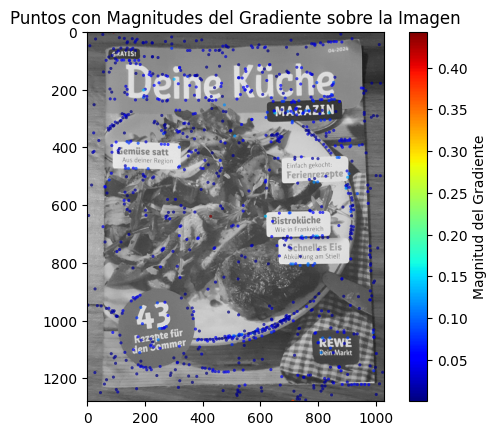

In [77]:
# Crear la figura y el eje
fig, ax = plt.subplots()

# Mostrar la imagen en escala de grises
gray_image_revista = cv2.cvtColor(image_revista, cv2.COLOR_BGR2GRAY)
ax.imshow(gray_image_revista, cmap='gray')

# Usar un mapa de colores para asignar colores según la magnitud
cmap = plt.cm.jet  # Mapa de colores
norm = mcolors.Normalize(vmin=min(magnitudes_revista.values()), vmax=max(magnitudes_revista.values()))  # Normalizador

# Colocar puntos sobre la imagen en función de la magnitud del gradiente
for (row, col, sigma), magnitude in magnitudes_revista.items():
    color = cmap(norm(magnitude))  # Obtener el color correspondiente
    ax.scatter(col, row, color=color, s=5, edgecolors='none', alpha=0.7)  # Dibujar el punto sin borde

# Crear un objeto mappable para la barra de colores
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])  # Obligatorio para evitar errores
fig.colorbar(sm, ax=ax, label="Magnitud del Gradiente")  # Agregar la barra de colores al eje

ax.set_title("Puntos con Magnitudes del Gradiente sobre la Imagen")
plt.show()

In [78]:
magnitudes_mueble, orientations_mueble = compute_magnitude_orientation(image_mueble, stable_keypoints_mueble, DoG_images_mueble, sigma_values_mueble)

In [79]:
# Crear la carpeta si no existe
os.makedirs('datos', exist_ok=True)

# Guardar el diccionario de magnitudes en un archivo
with open('datos/magnitudes_mueble.pkl', 'wb') as archivo:
    pickle.dump(magnitudes_mueble, archivo)

# Guardar el diccionario de orientaciones en un archivo
with open('datos/orientations_mueble.pkl', 'wb') as archivo:
    pickle.dump(orientations_mueble, archivo)

In [80]:
# Cargar el diccionario de magnitudes desde el archivo
with open('datos/magnitudes_mueble.pkl', 'rb') as archivo:
    magnitudes_mueble = pickle.load(archivo)

# Cargar el diccionario de orientaciones desde el archivo
with open('datos/orientations_mueble.pkl', 'rb') as archivo:
    orientations_mueble = pickle.load(archivo)

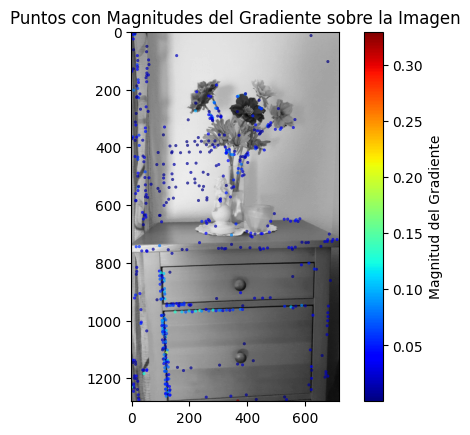

In [81]:
# Crear la figura y el eje
fig, ax = plt.subplots()

# Mostrar la imagen en escala de grises
gray_image_mueble = cv2.cvtColor(image_mueble, cv2.COLOR_BGR2GRAY)
ax.imshow(gray_image_mueble, cmap='gray')

# Usar un mapa de colores para asignar colores según la magnitud
cmap = plt.cm.jet  # Mapa de colores
norm = mcolors.Normalize(vmin=min(magnitudes_mueble.values()), vmax=max(magnitudes_mueble.values()))  # Normalizador

# Colocar puntos sobre la imagen en función de la magnitud del gradiente
for (row, col, sigma), magnitude in magnitudes_mueble.items():
    color = cmap(norm(magnitude))  # Obtener el color correspondiente
    ax.scatter(col, row, color=color, s=5, edgecolors='none', alpha=0.7)  # Dibujar el punto sin borde

# Crear un objeto mappable para la barra de colores
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])  # Obligatorio para evitar errores
fig.colorbar(sm, ax=ax, label="Magnitud del Gradiente")  # Agregar la barra de colores al eje

ax.set_title("Puntos con Magnitudes del Gradiente sobre la Imagen")
plt.show()

La siguiente función, `trilinear_interpolation`, se encarga de llevar a cabo una interpolación lineal en un punto clave dado, para así mitigar los *boundary effects* en los puntos cercanos a los bordes de la imagen. De esta forma, se distribuyen los valores de cada gradiente entre *bins* adyacentes de los histogramas, considerando las tres dimensiones: las dos espaciales $(x,y)$ y la orientación $(\theta)$. Se usarán pesos $d$ y $1-d$ para repartir dichos valores entre los *bins* más cercanos, siendo $d$ la distancia normalizada en unidades de espaciado de bins.

In [82]:
def trilinear_interpolation(keypoint, magnitudes, orientations, bins=36, window_size=16):
    """
    Interpola los gradientes trilinealmente entre los bins adyacentes en las tres dimensiones: X, Y y orientación.

    Parámetros:
    - keypoint: tupla con las coordenadas del keypoint (row, col, sigma)
    - magnitudes: diccionario de magnitudes de los gradientes
    - orientations: diccionario con las orientaciones de los gradientes
    - bins: número de bins para la orientación (por defecto 36)
    - window_size: tamaño de la ventana cuadrada alrededor del keypoint

    Devuelve:
    - interpolated_magnitudes: magnitudes actualizadas con la interpolación trilineal.
    """

    # Desempaquetar el keypoint
    row, col, sigma = keypoint

    # Calcular la orientación del keypoint desde el diccionario
    orientation = orientations[keypoint]  # Obtener la orientación para este keypoint

    # Paso 1: Crear un diccionario nuevo para las magnitudes interpoladas
    interpolated_magnitudes = {}

    # Paso 2: Calcular los índices de los bins más cercanos para x, y y orientación
    bin_width = 360 / bins  # Ancho de cada bin de orientación en grados

    # Para orientación
    bin_idx_theta = int(orientation // bin_width) % bins  # Índice del bin de orientación

    # Para las coordenadas espaciales (row, col), calculamos los bins correspondientes
    x_idx = int(row) % window_size
    y_idx = int(col) % window_size

    # Paso 3: Calcular las distancias normalizadas en cada dimensión
    # Cálculo del centro de la ventana
    center = window_size // 2

    # Calcular las distancias en x e y dentro de la ventana
    dx = abs(x_idx - center) / float(window_size / 2)  # Normalizado a [0, 1]
    dy = abs(y_idx - center) / float(window_size / 2)  # Normalizado a [0, 1]

    # Aseguramos que las distancias estén en el rango [0, 1]
    dx = max(0, min(dx, 1))
    dy = max(0, min(dy, 1))

    # Calcular la diferencia angular respecto al centro del bin
    bin_center_theta = bin_idx_theta * bin_width  # El centro del bin en grados

    # Normalizar la diferencia angular
    dtheta = abs(orientation - bin_center_theta) / bin_width

    # Asegurarse de que la distancia angular no exceda 1
    dtheta = min(dtheta, 1)

    # Paso 4: Distribuir las magnitudes en los bins adyacentes usando la distancia normalizada
    # En cada dimensión (x, y, orientación), distribuimos las magnitudes en los dos bins más cercanos
    weight_x1 = max(0, 1 - dx)          # Peso para el bin anterior en x (debe ser positivo)
    weight_x2 = max(0, dx)              # Peso para el siguiente bin en x (debe ser positivo)
    weight_y1 = max(0, 1 - dy)          # Peso para el bin anterior en y (debe ser positivo)
    weight_y2 = max(0, dy)              # Peso para el siguiente bin en y (debe ser positivo)
    weight_theta1 = max(0, 1 - dtheta)  # Peso para el bin anterior en orientación
    weight_theta2 = max(0, dtheta)      # Peso para el siguiente bin en orientación

    # Paso 5: Actualizar las magnitudes en los bins adyacentes en el diccionario nuevo
    # Magnitud del gradiente para este keypoint
    magnitude = magnitudes[(row, col, sigma)]

    # Distribuir las magnitudes en los bins adyacentes
    # Primera orientación
    bins_to_update = [
        ((x_idx, y_idx, bin_idx_theta), weight_x1 * weight_y1 * weight_theta1),
        ((x_idx + 1, y_idx, bin_idx_theta), weight_x2 * weight_y1 * weight_theta1),
        ((x_idx, y_idx + 1, bin_idx_theta), weight_x1 * weight_y2 * weight_theta1),
        ((x_idx + 1, y_idx + 1, bin_idx_theta), weight_x2 * weight_y2 * weight_theta1),
    ]

    # Segunda orientación (siguiente bin de orientación)
    next_bin_idx_theta = (bin_idx_theta + 1) % bins
    bins_to_update += [
        ((x_idx, y_idx, next_bin_idx_theta), weight_x1 * weight_y1 * weight_theta2),
        ((x_idx + 1, y_idx, next_bin_idx_theta), weight_x2 * weight_y1 * weight_theta2),
        ((x_idx, y_idx + 1, next_bin_idx_theta), weight_x1 * weight_y2 * weight_theta2),
        ((x_idx + 1, y_idx + 1, next_bin_idx_theta), weight_x2 * weight_y2 * weight_theta2),
    ]

    # Actualizar las magnitudes en los bins
    for (bin_coords, weight) in bins_to_update:
        interpolated_magnitudes[bin_coords] = interpolated_magnitudes.get(bin_coords, 0) + magnitude * weight

    return interpolated_magnitudes

Por otro lado, la función `compute_orientation_histogram` se encarga de construir los histogramas de orientaciones del gradiente para cada punto clave. En cada punto, en lugar de asignar su magnitud a un único *bin*, se usa la función anterior para, mediante interpolación lineal, distribuir dicha magnitud entre los bins más cercanos en $x$, $y$ y $\theta$. Al final, se normaliza cada histograma para asegurarnos de que la suma total de todas las magnitudes sea igual a $1$. De esta forma, cada *bin* contiene la suma de magnitudes del gradiente ponderadas para ángulos que caen en dicho *bin*.

In [83]:
def compute_orientation_histogram(magnitudes, orientations, stable_keypoints, bins=36, window_size=16):
    """
    Construye los histogramas de orientaciones del gradiente en un vecindario centrado en un keypoint,
    utilizando las magnitudes interpoladas.

    Parámetros:
    - magnitudes: diccionario con las magnitudes de los gradientes
    - orientations: diccionario con las orientaciones de los gradientes
    - stable_keypoints: diccionario con los keypoints con precisión subpíxel
    - bins: número de bins en el histograma, 36 por defecto para divisiones de 10°
    - window_size: tamaño del vecindario cuadrado alrededor del keypoint

    Devuelve:
    - histograms: diccionario con los histogramas de orientaciones para cada keypoint
    """
    histograms = {}  # Diccionario para almacenar los histogramas de cada keypoint

    # Crear una ventana gaussiana para pesar los gradientes por distancia al centro
    center = window_size // 2
    gaussian_window = np.zeros((window_size, window_size))
    sigma_gaussian = window_size / 6  # Definir el ancho de la ventana gaussiana
    for i in range(window_size):
        for j in range(window_size):
            x, y = i - center, j - center
            gaussian_window[i, j] = np.exp(-(x ** 2 + y ** 2) / (2 * sigma_gaussian ** 2))

    # Iterar sobre todos los keypoints
    for keypoint in stable_keypoints.values():
        # Calcular las magnitudes interpoladas para este keypoint
        interpolated_magnitudes = trilinear_interpolation(
            keypoint, magnitudes, orientations, bins=bins, window_size=window_size
        )

        # Crear un histograma vacío para este keypoint
        histogram = np.zeros(bins, dtype=np.float32)

        # Iterar sobre las claves de las magnitudes interpoladas
        for (x_idx, y_idx, bin_idx), interpolated_magnitude in interpolated_magnitudes.items():
            # Calcular el peso gaussiano para las coordenadas interpoladas
            if 0 <= x_idx < window_size and 0 <= y_idx < window_size:
                weight = gaussian_window[x_idx, y_idx]

                # Pesar la magnitud interpolada
                weighted_magnitude = interpolated_magnitude * weight

                # Acumular en el bin correspondiente del histograma
                histogram[bin_idx % bins] += weighted_magnitude

        # Normalizar el histograma
        if np.sum(histogram) > 0:
            histogram /= np.sum(histogram)

        # Guardar el histograma en el diccionario final
        histograms[keypoint] = histogram

    return histograms

A continuación, se obtienen los histogramas de orientaciones del gradiente para cada uno de los puntos clave de las imágenes seleccionadas. Además, para cada imagen se toma un punto clave de ejemplo y se muestra su histograma asociado.

In [84]:
histograms_revista = compute_orientation_histogram(magnitudes_revista, orientations_revista, stable_keypoints_revista)

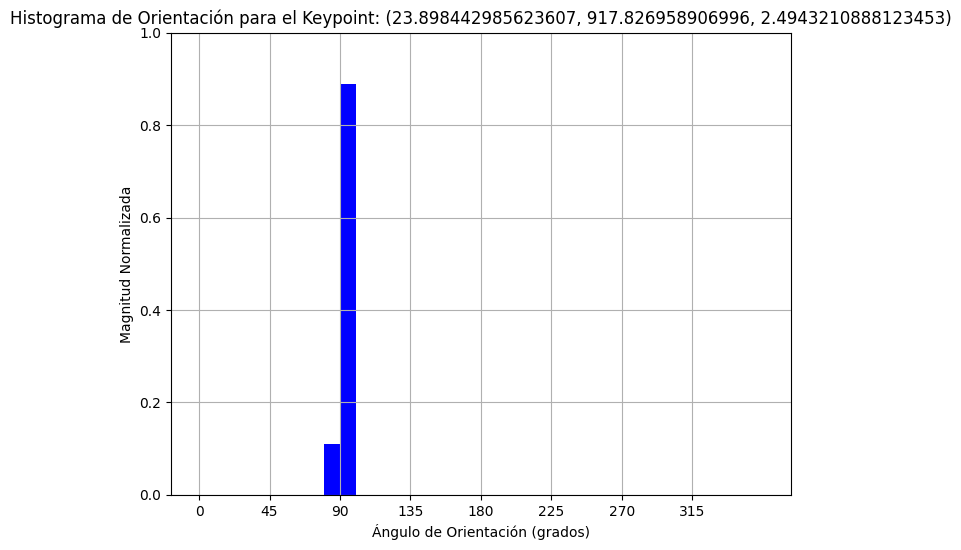

In [85]:
# Vamos a seleccionar un keypoint de ejemplo
example_keypoint = list(histograms_revista.keys())[0]  # Tomamos el primer keypoint como ejemplo

# Obtener el histograma correspondiente a ese keypoint
histogram = histograms_revista[example_keypoint]

# Crear un gráfico de barras para mostrar el histograma de orientaciones
plt.figure(figsize=(8, 6))
bins = np.arange(0, 36)  # 36 bins para 360 grados (10 grados por bin)
bin_centers = (bins + 0.5) * (360 / 36)  # Los centros de los bins (en grados)

plt.bar(bin_centers, histogram, width=10, align='center', color='blue')
plt.title(f"Histograma de Orientación para el Keypoint: {example_keypoint}")
plt.xlabel("Ángulo de Orientación (grados)")
plt.ylabel("Magnitud Normalizada")
plt.xticks(np.arange(0, 360, 45))  # Mostrar ticks cada 45 grados
plt.yticks(np.linspace(0, 1, 6))  # Escala de 0 a 1 para las magnitudes normalizadas
plt.grid(True)
plt.show()

In [86]:
histograms_mueble = compute_orientation_histogram(magnitudes_mueble, orientations_mueble, stable_keypoints_mueble)

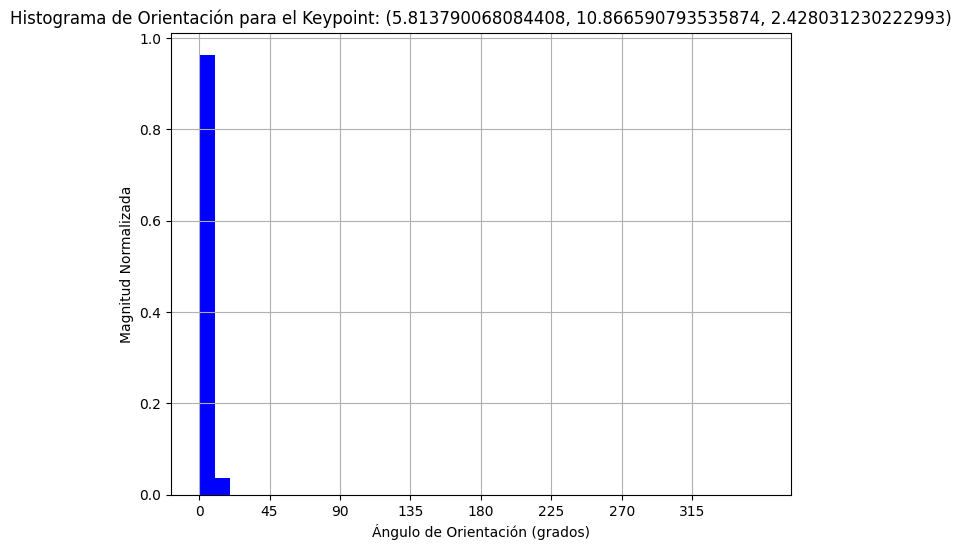

In [87]:
# Vamos a seleccionar un keypoint de ejemplo
example_keypoint = list(histograms_mueble.keys())[0]  # Tomamos el primer keypoint como ejemplo

# Obtener el histograma correspondiente a ese keypoint
histogram = histograms_mueble[example_keypoint]

# Crear un gráfico de barras para mostrar el histograma de orientaciones
plt.figure(figsize=(8, 6))
bins = np.arange(0, 36)  # 36 bins para 360 grados (10 grados por bin)
bin_centers = (bins + 0.5) * (360 / 36)  # Los centros de los bins (en grados)

plt.bar(bin_centers, histogram, width=10, align='center', color='blue')
plt.title(f"Histograma de Orientación para el Keypoint: {example_keypoint}")
plt.xlabel("Ángulo de Orientación (grados)")
plt.ylabel("Magnitud Normalizada")
plt.xticks(np.arange(0, 360, 45))  # Mostrar ticks cada 45 grados
plt.yticks(np.linspace(0, 1, 6))  # Escala de 0 a 1 para las magnitudes normalizadas
plt.grid(True)
plt.show()

Para continuar, debemos encontrar las orientaciones dominantes para cada uno de los histogramas de orientaciones obtenidos, y además es necesario utilizar interpolación cuadrática para mejorar la precisión de la orientación. De esta forma, las siguiente función, `quadratic_interpolation`, dado un histograma y un pico de dicho histograma, se encarga de aplicar interpolación cuadrática para refinar la orientación del pico.

In [88]:
def quadratic_interpolation(histogram, peak_bin):
    """
    Aplica interpolación cuadrática para refinar la estimación de la orientación en un histograma.

    Parámetros:
    - histogram: valores de un histograma
    - peak_bin: índice del bin que contiene el valor máximo del histograma (pico)

    Devuelve:
    - refined_peak: orientación refinada mediante interpolación cuadrática
    """
    # Índices de los bins anterior, actual y siguiente
    prev_bin = (peak_bin - 1) % len(histogram)
    next_bin = (peak_bin + 1) % len(histogram)

    # Valores de los bins
    prev_value = histogram[prev_bin]
    peak_value = histogram[peak_bin]
    next_value = histogram[next_bin]

    # Derivadas
    first_deriv = (next_value - prev_value)/2
    second_deriv = (prev_value - 2 * peak_value + next_value)

    # Cálculo de la interpolación cuadrática
    peak_hat =  -(first_deriv / second_deriv)   # Refina la ubicación del pico
    refined_peak = (peak_bin + peak_hat) * (360 / len(histogram))  # Ángulo refinado

    return refined_peak

Usando la función que acabamos de definir, ya podemos encontrar para todos los histogramas las orientaciones dominantes o picos, así como un posible segundo pico, que será considerado como significativo cuando su valor en el histograma esté por encima del $80\%$ del valor del primer pico. Utilizaremos interpolación cuadrática para mejorar la precisión de la orientación de dichos picos. Para llevar todo esto a cabo, usaremos la función `compute_orientation_peaks`, que se define a continuación:

In [89]:
def compute_orientation_peaks(histograms, threshold=0.8):
    """
    Encuentra las orientaciones dominantes para un conjunto de histogramas de orientaciones,
    utilizando interpolación cuadrática para mejorar la precisión de la orientación y detectando
    un posible segundo pico significativo (por encima del 80% del primer pico).

    Parámetros:
    - histograms: diccionario con los histogramas de orientaciones para cada keypoint
    - threshold: valor mínimo relativo para considerar un segundo pico (por defecto 0.8)

    Devuelve:
    - orientation_peaks: diccionario donde las claves son los keypoints y los valores son las orientaciones dominantes en grados
    - second_peaks: diccionario donde las claves son los keypoints y los valores son las orientaciones del segundo pico si es significativo
    """
    orientation_peaks = {}
    second_peaks = {}  # Diccionario para almacenar los segundos picos por keypoint

    for keypoint, histogram in histograms.items():
        max_peak = np.argmax(histogram)  # Índice del pico más alto

        # Refinar el primer pico usando interpolación cuadrática
        refined_peak = quadratic_interpolation(histogram, max_peak)

        # Guardar la orientación dominante para este keypoint
        orientation_peaks[keypoint] = refined_peak

        # Crear una copia del histograma y eliminar el pico más alto (ponerlo a cero)
        histogram_copy = histogram.copy()
        histogram_copy[max_peak] = 0  # Eliminar el valor del primer pico

        # Encontrar el segundo pico en el histograma modificado
        second_peak = np.argmax(histogram_copy)  # Buscar el valor máximo en el nuevo histograma
        second_value = histogram_copy[second_peak]

        # Verificar si el segundo pico es significativo
        if second_value > threshold * histogram[max_peak]:  # Si es > 80% del primer pico
            refined_second_peak = quadratic_interpolation(histogram, second_peak)

            # Guardar el segundo pico refinado en el diccionario
            second_peaks[keypoint] = refined_second_peak  # Agregar el segundo pico

    return orientation_peaks, second_peaks

Probamos la anterior función con las imágenes con las que estamos trabajando, para obtener las correspondientes orientaciones dominantes:

In [90]:
orientation_peaks_revista, second_peaks_revista = compute_orientation_peaks(histograms_revista)

In [91]:
orientation_peaks_mueble, second_peaks_mueble = compute_orientation_peaks(histograms_mueble)

#### Paso 5: Extracción de los vectores descriptores basados en la estructura de los gradientes locales

Ahora que ya hemos realizado la caracterización de la orientación, habiendo obtenido las orientaciones dominantes para cada uno de los puntos clave, nos queda extraer los vectores descriptores basándonos en la estructura de los gradientes locales.

En primer lugar, vamos a usar la función `rotate_patches` para, para cada punto clave, extraer un parche de la imagen original centrado en dicho punto y, a continuación, rotar el parche en función de la orientación dominante correspondiente de forma que dicha orientación quede alineada hacia arriba. En caso de que haya una segunda orientación significativa (segundo pico), también se genera un parche rotado en esa dirección.

In [92]:
def rotate_patches(image, orientation_peaks, second_peaks, window_size=16):
    """
    Rota el parche de la imagen alrededor de cada keypoint para alinear su orientación dominante hacia arriba.

    Parámetros:
    - image: imagen original
    - orientation_peaks: diccionario donde las claves son los keypoints y los valores son las orientaciones dominantes en grados
    - second_peaks: diccionario donde las claves son los keypoints y los valores son las orientaciones del segundo pico si es significativo
    - window_size: tamaño del parche cuadrado (por defecto 16x16)

    Devuelve:
    - rotated_patches: diccionario con listas de parches de la imagen rotados para cada keypoint
    """
    # Convertir la imagen a escala de grises
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    rotated_patches = {}

    for keypoint in orientation_peaks.keys():
        # Extraer el parche alrededor del keypoint
        row, col, sigma = keypoint
        half_window = window_size // 2

        # Extraer el pico dominante (y el segundo pico, si es el caso) para el keypoint
        max_peak = orientation_peaks[keypoint]
        if keypoint in second_peaks.keys():
            second_peak = second_peaks[keypoint]

        # Calcular los límites de extracción del parche
        start_row = max(0, int(row) - half_window)
        end_row = min(gray_image.shape[0], int(row) + half_window)
        start_col = max(0, int(col) - half_window)
        end_col = min(gray_image.shape[1], int(col) + half_window)

        # Extraer el parche
        patch = gray_image[start_row:end_row, start_col:end_col]

        # Si el parche no tiene el tamaño esperado, aplicar padding
        if patch.shape[0] != window_size or patch.shape[1] != window_size:
            padded_patch = np.zeros((window_size, window_size), dtype=patch.dtype)

            # Calcular el desplazamiento para centrar el parche
            start_x = (window_size - patch.shape[1]) // 2
            start_y = (window_size - patch.shape[0]) // 2

            # Copiar el contenido al centro
            padded_patch[start_y:start_y + patch.shape[0], start_x:start_x + patch.shape[1]] = patch

            patch = padded_patch

        # Crear la matriz de rotación
        rotation_matrix = cv2.getRotationMatrix2D((half_window, half_window), max_peak, 1)

        # Realizar la rotación de la imagen
        rotated_patch = cv2.warpAffine(patch, rotation_matrix, (window_size, window_size))

        # Lista con los parches
        rotated_patches_keypoint = [rotated_patch]

        # Si el keypoint tiene un segundo pico, rotamos la imagen en esa orientación
        if keypoint in second_peaks.keys():
            # Crear la matriz de rotación
            second_rotation_matrix = cv2.getRotationMatrix2D((half_window, half_window), second_peak, 1)

            # Realizar la rotación de la imagen
            second_rotated_patch = cv2.warpAffine(patch, second_rotation_matrix, (window_size, window_size))

            # Añadimos a la lista el segundo parche
            rotated_patches_keypoint.append(second_rotated_patch)

        rotated_patches[keypoint] = rotated_patches_keypoint

    return rotated_patches

Usamos la función recién definida para obtener los parches rotados para las imágenes consideradas:

In [93]:
rotated_patches_revista = rotate_patches(image_revista, orientation_peaks_revista, second_peaks_revista)

In [94]:
rotated_patches_mueble = rotate_patches(image_mueble, orientation_peaks_mueble, second_peaks_mueble)

En segundo lugar, una vez obtenidos los parches rotados, necesitamos una función que divida cada uno de esos parches en una cuadrícula de celdas. Esto lo podemos llevar a cabo mediante la función `divide_patch_into_cells`.

In [95]:
def divide_patch_into_cells(rotated_patches, num_cells=4):
    """
    Divide cada parche en una cuadrícula de celdas.

    Parámetros:
    - rotated_patches: parches de imagen (rotados previamente), de tamaño window_size x window_size.
    - num_cells: número de celdas por dimensión (por defecto 4, para una cuadrícula 4x4).

    Devuelve:
    - cells: diccionario de subparches (celdas) divididos.
    """
    cells = {}

    for keypoint in rotated_patches.keys():
        cells_keypoint = []

        for rotated_patch in rotated_patches[keypoint]:
            window_size = rotated_patch.shape[0]  # Se asume que es un parche cuadrado
            cell_size = window_size // num_cells  # Tamaño de cada celda

            cells_patch = []
            for i in range(num_cells):
                for j in range(num_cells):
                    # Extraer subparche para cada celda
                    cell = rotated_patch[i*cell_size:(i+1)*cell_size, j*cell_size:(j+1)*cell_size]
                    cells_patch.append(cell)

            cells_keypoint.append(cells_patch)

        cells[keypoint] = cells_keypoint

    return cells

Aplicamos esta función a las imágenes consideradas para obtener las celdas correspondientes a cada uno de sus puntos clave:

In [96]:
cells_revista = divide_patch_into_cells(rotated_patches_revista)

In [97]:
cells_mueble = divide_patch_into_cells(rotated_patches_mueble)

Por otro lado, una vez obtenidas las celdas para cada uno de los parches, debemos calcular las magnitudes y las orientaciones de los gradientes para cada celda. La función `compute_gradients_in_cell` toma una celda y calcula dichos valores para la celda dada.

In [98]:
def compute_gradients_in_cell(cell):
    """
    Calcula las magnitudes y orientaciones de los gradientes en una celda de imagen
    utilizando diferencias finitas en las direcciones x e y.

    Parámetros:
    - cell: Celda de la imagen (submatriz de tamaño menor dentro de un parche) sobre la cual calcular los gradientes.

    Devuelve:
    - cell_magnitudes: Matriz con las magnitudes de los gradientes en cada punto de la celda.
    - cell_orientations: Matriz con las orientaciones de los gradientes en cada punto de la celda, en grados.
    """
    # Tamaño de la celda
    height, width = cell.shape

    # Inicializar matrices para las magnitudes y orientaciones
    cell_magnitudes = np.zeros_like(cell, dtype=np.float32)
    cell_orientations = np.zeros_like(cell, dtype=np.float32)

    # Calcular gradientes en cada punto de la celda
    for row in range(1, height - 1):
        for col in range(1, width - 1):
            # Gradiente en x (diferencia entre píxeles adyacentes en la dirección horizontal)
            dx = cell[row, col + 1] - cell[row, col - 1]

            # Gradiente en y (diferencia entre píxeles adyacentes en la dirección vertical)
            dy = cell[row + 1, col] - cell[row - 1, col]

            # Calcular la magnitud del gradiente
            cell_magnitudes[row, col] = np.sqrt(dx**2 + dy**2)

            # Calcular la orientación del gradiente (en grados)
            orientation = np.arctan2(dy, dx) * 180 / np.pi
            orientation = orientation % 360  # Asegurar que esté entre 0 y 360 grados
            cell_orientations[row, col] = orientation

    return cell_magnitudes, cell_orientations

La función `compute_histograms_in_cells` que se define a continuación calcula los histogramas de orientaciones del gradiente para cada una de las celdas obtenidas anteriormente. Para ello utiliza la función anterior para calcular las magnitudes y las orientaciones del gradiente, necesarias para obtener los histogramas.

In [99]:
def compute_histograms_in_cells(cells, n_bins=8):
    """
    Calcula un histograma de orientaciones del gradiente para cada celda en el diccionario de celdas.

    Parámetros:
    - cells: Diccionario de celdas (submatrices) que representan partes de los parches rotados.
    - n_bins: Número de bins en el histograma, por defecto 8 para divisiones de 45°.

    Devuelve:
    - cell_histograms: Diccionario de histogramas de orientaciones para cada keypoint, uno por cada celda.
    """
    cell_histograms = {}

    # Rango de cada bin en grados
    bin_range = 360 / n_bins

    for keypoint in cells.keys():
        keypoint_histograms = []

        for cells_patch in cells[keypoint]:
            patch_histograms = []

            for cell in cells_patch:
                # Calcular gradientes en la celda
                cell_magnitudes, cell_orientations = compute_gradients_in_cell(cell)

                # Inicializar el histograma para esta celda
                histogram = np.zeros(n_bins, dtype=np.float32)

                # Recorrer los píxeles de la celda
                for row in range(cell.shape[0]):
                    for col in range(cell.shape[1]):
                        magnitude = cell_magnitudes[row, col]
                        orientation = cell_orientations[row, col]

                        # Determinar el bin correspondiente para la orientación
                        bin_idx = int(orientation // bin_range) % n_bins

                        # Acumular la magnitud en el bin correspondiente
                        histogram[bin_idx] += magnitude

                # Normalizar el histograma
                if np.sum(histogram) > 0:
                    histogram /= np.sum(histogram)

                # Agregar el histograma calculado para una celda a la lista de histogramas
                patch_histograms.append(histogram)

            # Agregar la lista de histogramas obtenida para cada orientación
            keypoint_histograms.append(patch_histograms)

        cell_histograms[keypoint] = keypoint_histograms

    return cell_histograms

A continuación se obtienen los histogramas para cada imagen seleccionada, para cada uno de sus puntos clave, para cada uno de los parches de cada punto clave, para cada una de las celdas que componen dichos parches. Además, se representan los histogramas obtenidos para un punto clave de ejemplo, mostrando la distribución de orientaciones en las celdas de sus parches rotados.

In [100]:
cell_histograms_revista = compute_histograms_in_cells(cells_revista)

<ipython-input-98-3f4befa54c26>:24: RuntimeWarning: overflow encountered in scalar subtract
  dx = cell[row, col + 1] - cell[row, col - 1]
<ipython-input-98-3f4befa54c26>:27: RuntimeWarning: overflow encountered in scalar subtract
  dy = cell[row + 1, col] - cell[row - 1, col]


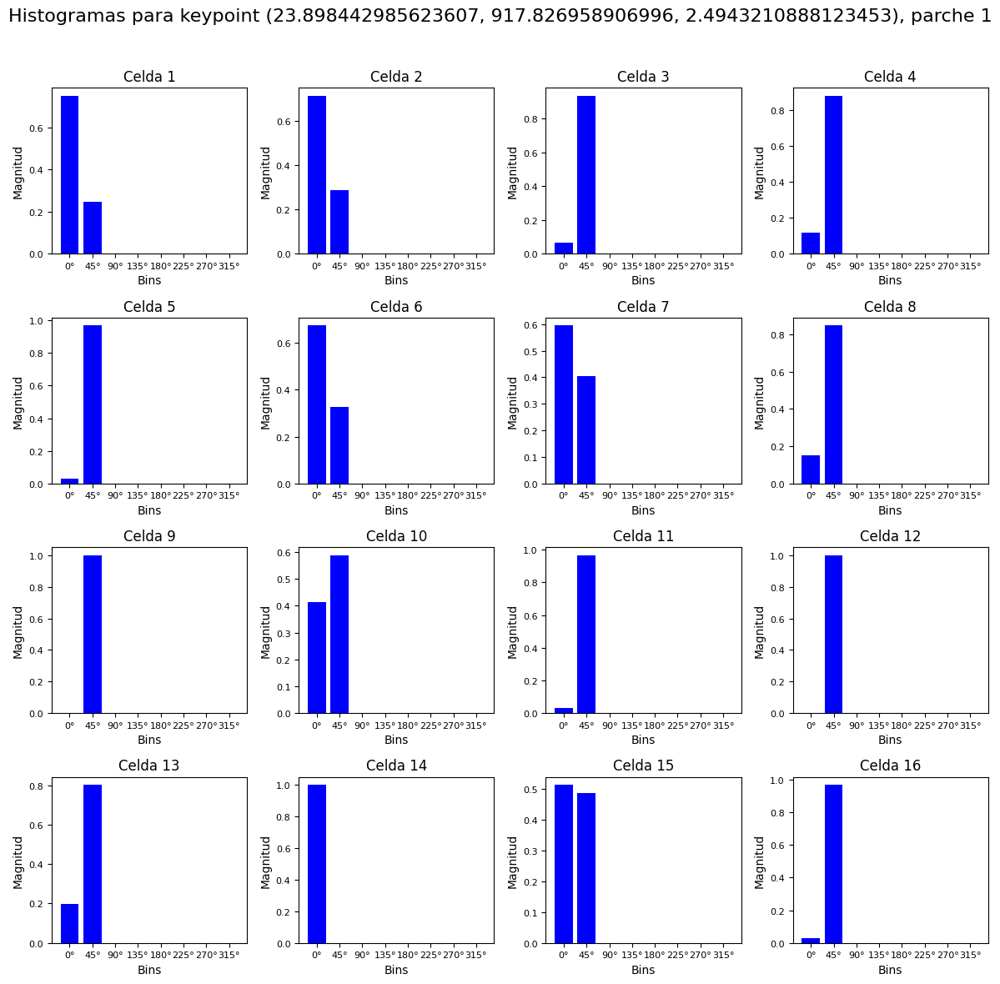

In [101]:
n_bins = 8

# Vamos a seleccionar un keypoint de ejemplo
example_keypoint = list(cell_histograms_revista.keys())[0]  # Tomamos el primer keypoint como ejemplo

# Obtener los histogramas correspondientes a ese keypoint
keypoint_histograms = cell_histograms_revista[example_keypoint]

# Configuración para mejorar la visualización
histograms_per_row = 4  # Número de histogramas por fila

# Iterar sobre los histogramas de parches para este keypoint
for patch_idx, patch_histograms in enumerate(keypoint_histograms):
    num_cells = len(patch_histograms)
    rows = (num_cells + histograms_per_row - 1) // histograms_per_row  # Calcular filas necesarias

    plt.figure(figsize=(histograms_per_row * 3, rows * 3))  # Ajustar tamaño de figura
    plt.suptitle(f"Histogramas para keypoint {example_keypoint}, parche {patch_idx + 1}", fontsize=16)

    # Representar cada celda
    for cell_idx, histogram in enumerate(patch_histograms):
        plt.subplot(rows, histograms_per_row, cell_idx + 1)
        plt.bar(range(n_bins), histogram, width=0.8, color='blue')
        plt.title(f"Celda {cell_idx + 1}")
        plt.xlabel("Bins")
        plt.ylabel("Magnitud")
        plt.xticks(range(n_bins), [f"{i*(360//n_bins)}°" for i in range(n_bins)], fontsize=8)
        plt.yticks(fontsize=8)

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

In [102]:
cell_histograms_mueble = compute_histograms_in_cells(cells_mueble)

<ipython-input-98-3f4befa54c26>:24: RuntimeWarning: overflow encountered in scalar subtract
  dx = cell[row, col + 1] - cell[row, col - 1]
<ipython-input-98-3f4befa54c26>:27: RuntimeWarning: overflow encountered in scalar subtract
  dy = cell[row + 1, col] - cell[row - 1, col]


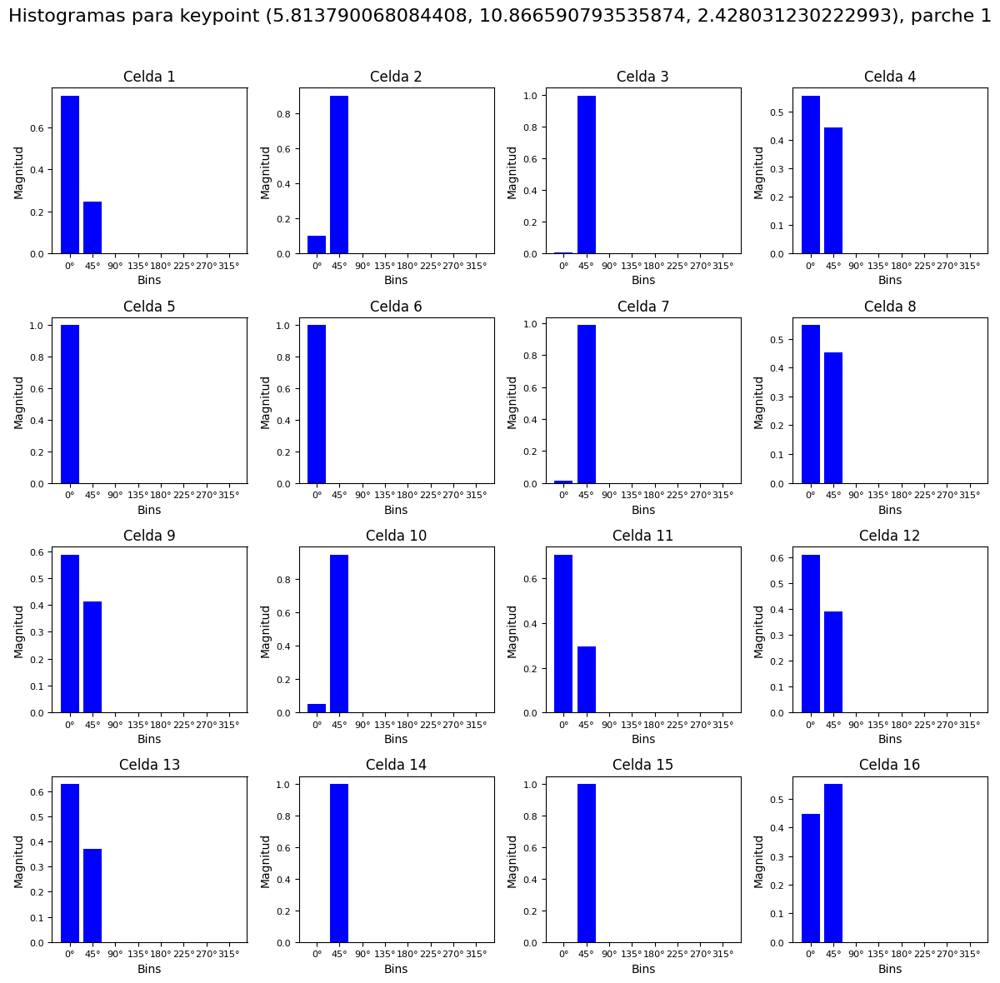

In [103]:
n_bins = 8

# Vamos a seleccionar un keypoint de ejemplo
example_keypoint = list(cell_histograms_mueble.keys())[0]  # Tomamos el primer keypoint como ejemplo

# Obtener los histogramas correspondientes a ese keypoint
keypoint_histograms = cell_histograms_mueble[example_keypoint]

# Configuración para mejorar la visualización
histograms_per_row = 4  # Número de histogramas por fila

# Iterar sobre los histogramas de parches para este keypoint
for patch_idx, patch_histograms in enumerate(keypoint_histograms):
    num_cells = len(patch_histograms)
    rows = (num_cells + histograms_per_row - 1) // histograms_per_row  # Calcular filas necesarias

    plt.figure(figsize=(histograms_per_row * 3, rows * 3))  # Ajustar tamaño de figura
    plt.suptitle(f"Histogramas para keypoint {example_keypoint}, parche {patch_idx + 1}", fontsize=16)

    # Representar cada celda
    for cell_idx, histogram in enumerate(patch_histograms):
        plt.subplot(rows, histograms_per_row, cell_idx + 1)
        plt.bar(range(n_bins), histogram, width=0.8, color='blue')
        plt.title(f"Celda {cell_idx + 1}")
        plt.xlabel("Bins")
        plt.ylabel("Magnitud")
        plt.xticks(range(n_bins), [f"{i*(360//n_bins)}°" for i in range(n_bins)], fontsize=8)
        plt.yticks(fontsize=8)

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

Finalmente, debemos calcular los descriptores correspondientes a cada punto clave obtenido. Para ello, usamos la función `compute_descriptor_from_cells` que, para cada punto clave, calcula un descriptor (o dos, si hay dos orientaciones significativas, es decir, dos picos) a partir de los histogramas de las celdas. Además, normaliza los descriptores a longitud $1$ para obtener invarianza a cambios lineales de iluminación. Luego, recorta los valores muy positivos del vector (mayores a $0.2$) y vuelve a normalizar, para obtener cierta invarianza a cambios no lineales de iluminación.

In [104]:
def compute_descriptor_from_cells(cells, n_bins=8, max_value=0.2):
    """
    Calcula el descriptor (o los descriptores) de cada keypoint utilizando los histogramas de las celdas.
    Este descriptor es un vector largo que describe el patrón de gradientes del keypoint.

    Parámetros:
    - cells: Diccionarios de celdas que componen los parche de los keypoints.
    - n_bins: Número de bins por celda (por defecto 8 para divisiones de 45°).
    - max_value: Valor máximo al que truncar las componentes del descriptor para evitar la saturación.

    Devuelve:
    - descriptors: Diccionario con los vectores de características (longitud 128 para 4x4 celdas y 8 bins).
    """
    descriptors = {}

    # Calcular los histogramas de cada celda
    cell_histograms = compute_histograms_in_cells(cells, n_bins=n_bins)

    for keypoint in cell_histograms.keys():
        keypoint_descriptors = []   # Se almacenará un descriptor o dos según haya uno o dos picos significativos

        for patch_histograms in cell_histograms[keypoint]:  # Uno o dos parches según si hay uno o dos picos significativos

            # Concatenar todos los histogramas en un solo vector
            descriptor = np.concatenate(patch_histograms)

            # Normalizar el descriptor a longitud 1
            descriptor /= np.linalg.norm(descriptor)

            # Recortar los valores mayores a max_value
            descriptor[descriptor > max_value] = max_value

            # Volver a normalizar después del recorte
            descriptor /= np.linalg.norm(descriptor)

            keypoint_descriptors.append(descriptor)

        descriptors[keypoint] = keypoint_descriptors

    return descriptors

A continuación, se utiliza la función anterior para obtener los descriptores de los puntos clave para cada una de las imágenes consideradas. Además, para cada imagen, se muestran los descriptores para un punto clave de ejemplo, imprimiendo el vector correspondiente, y luego visualizándolo mediante un histograma.

In [105]:
descriptors_revista = compute_descriptor_from_cells(cells_revista)

<ipython-input-98-3f4befa54c26>:24: RuntimeWarning: overflow encountered in scalar subtract
  dx = cell[row, col + 1] - cell[row, col - 1]
<ipython-input-98-3f4befa54c26>:27: RuntimeWarning: overflow encountered in scalar subtract
  dy = cell[row + 1, col] - cell[row - 1, col]


In [106]:
# Selecciona un keypoint de ejemplo
example_keypoint = list(descriptors_revista.keys())[0]

# Obtener los descriptores para dicho keypoint
descriptors = descriptors_revista[example_keypoint]

# Obtenemos el primer descriptor (orientación principal) y el segundo (orientación secundaria) si es el caso
for i in range(len(descriptors)):
    descriptor = descriptors[i]

    print(f"Descriptor para el keypoint {example_keypoint} en la {i+1}ª dirección:")
    print(descriptor)

Descriptor para el keypoint (23.898442985623607, 917.826958906996, 2.4943210888123453) en la 1ª dirección:
[0.24434152 0.08660409 0.         0.         0.         0.
 0.         0.         0.24434152 0.10026959 0.         0.
 0.         0.         0.         0.         0.02229571 0.24434152
 0.         0.         0.         0.         0.         0.
 0.04108256 0.24434152 0.         0.         0.         0.
 0.         0.         0.01068438 0.24434152 0.         0.
 0.         0.         0.         0.         0.23561649 0.11383768
 0.         0.         0.         0.         0.         0.
 0.2078752  0.14157902 0.         0.         0.         0.
 0.         0.         0.0532601  0.24434152 0.         0.
 0.         0.         0.         0.         0.         0.24434152
 0.         0.         0.         0.         0.         0.
 0.14399183 0.20546237 0.         0.         0.         0.
 0.         0.         0.01187292 0.24434152 0.         0.
 0.         0.         0.         0.       

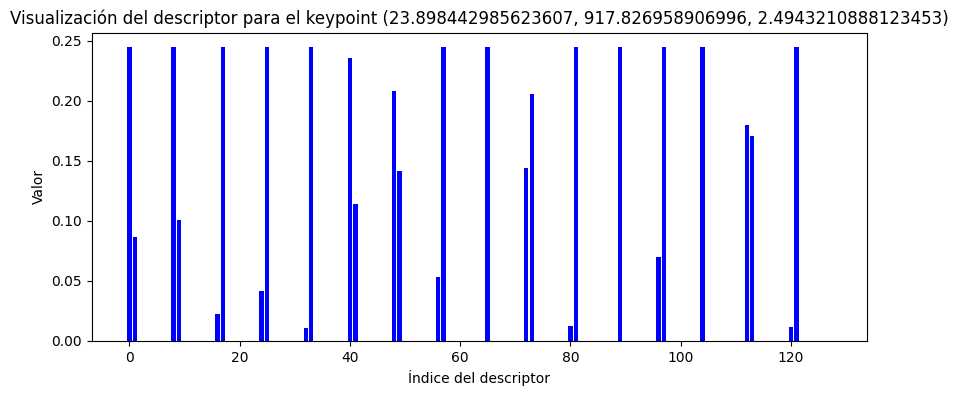

In [107]:
example_keypoint = list(descriptors_revista.keys())[0]  # Selecciona un keypoint de ejemplo
descriptor = descriptors_revista[example_keypoint][0]  # Primer descriptor (orientación principal)

plt.figure(figsize=(10, 4))
plt.bar(range(len(descriptor)), descriptor, width=0.8, color='blue')
plt.title(f"Visualización del descriptor para el keypoint {example_keypoint}")
plt.xlabel("Índice del descriptor")
plt.ylabel("Valor")
plt.show()

In [108]:
descriptors_mueble = compute_descriptor_from_cells(cells_mueble)

<ipython-input-98-3f4befa54c26>:24: RuntimeWarning: overflow encountered in scalar subtract
  dx = cell[row, col + 1] - cell[row, col - 1]
<ipython-input-98-3f4befa54c26>:27: RuntimeWarning: overflow encountered in scalar subtract
  dy = cell[row + 1, col] - cell[row - 1, col]


In [109]:
# Selecciona un keypoint de ejemplo
example_keypoint = list(descriptors_mueble.keys())[0]

# Obtener los descriptores para dicho keypoint
descriptors = descriptors_mueble[example_keypoint]

# Obtenemos el primer descriptor (orientación principal) y el segundo (orientación secundaria) si es el caso
for i in range(len(descriptors)):
    descriptor = descriptors[i]

    print(f"Descriptor para el keypoint {example_keypoint} en la {i+1}ª dirección:")
    print(descriptor)

Descriptor para el keypoint (5.813790068084408, 10.866590793535874, 2.428031230222993) en la 1ª dirección:
[0.24413131 0.08746342 0.         0.         0.         0.
 0.         0.         0.03587863 0.24413131 0.         0.
 0.         0.         0.         0.         0.00171006 0.24413131
 0.         0.         0.         0.         0.         0.
 0.1963473  0.15625127 0.         0.         0.         0.
 0.         0.         0.24413131 0.         0.         0.
 0.         0.         0.         0.         0.24413131 0.
 0.         0.         0.         0.         0.         0.
 0.00414466 0.24413131 0.         0.         0.         0.
 0.         0.         0.19283114 0.15976739 0.         0.
 0.         0.         0.         0.         0.20686577 0.14573279
 0.         0.         0.         0.         0.         0.
 0.01856334 0.24413131 0.         0.         0.         0.
 0.         0.         0.24413131 0.10366081 0.         0.
 0.         0.         0.         0.         0.2149

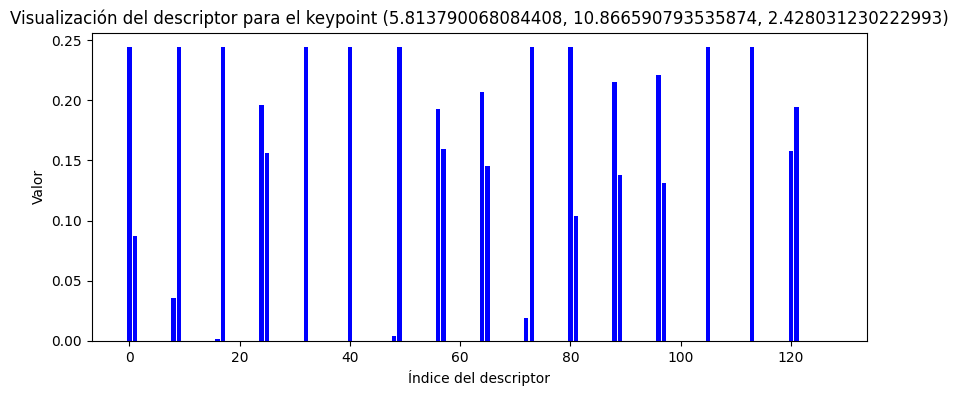

In [110]:
example_keypoint = list(descriptors_mueble.keys())[0]  # Selecciona un keypoint de ejemplo
descriptor = descriptors_mueble[example_keypoint][0]  # Primer descriptor (orientación principal)

plt.figure(figsize=(10, 4))
plt.bar(range(len(descriptor)), descriptor, width=0.8, color='blue')
plt.title(f"Visualización del descriptor para el keypoint {example_keypoint}")
plt.xlabel("Índice del descriptor")
plt.ylabel("Valor")
plt.show()